In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols, mixedlm

import time
from datetime import date

# updated src file changes are loaded
%load_ext autoreload
%autoreload 2

# load R language
os.environ["R_HOME"] = r"C:\Users\jacob\anaconda3\envs\water_current_project\Lib\R"
os.environ["PATH"] += r";C:\Users\jacob\anaconda3\envs\water_current_project\Lib\R\bin\x64"
%load_ext rpy2.ipython

from rpy2.robjects.packages import importr
lme4 = importr("lme4")

from rpy2.robjects import r
from rpy2.robjects import pandas2ri
pandas2ri.activate()





# ensures function files are visible: can use 'src.loading' for example
sys.path.append(os.path.abspath(".."))

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\rpy2\robjects\packages.py:367: UserWarning: The symbol 'quartz' is not in this R namespace/package.
  warnings.warn(


In [ ]:
### SANBOX TESTING

INFO: pip is looking at multiple versions of pystan to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of pystan to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
     ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
      --------------------------------------- 0.3/16.2 MB ? eta -:--:--
     -- ------------------------------------- 1.0/16.2 MB 2.8 MB/s eta 0:00:06
     --- ------------------------------------ 1.6/16.2 MB 2.8 MB/s eta 0:00:06
     ----- ---------------------------------- 2.4/16.2 MB 3.1 MB/s eta 0:00:05
     ------- -------------------------------- 3.1/16.2 MB 3.3 MB/s eta 0:00:04
     -

  error: subprocess-exited-with-error
  
  Getting requirements to build wheel did not run successfully.
  exit code: 1
  
  [17 lines of output]
  Traceback (most recent call last):
    File "C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 389, in <module>
      main()
    File "C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 373, in main
      json_out["return_val"] = hook(**hook_input["kwargs"])
    File "C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 143, in get_requires_for_build_wheel
      return hook(config_settings)
    File "C:\Users\jacob\AppData\Local\Temp\pip-build-env-2f11i1ht\overlay\Lib\site-packages\setuptools\build_meta.py", line 331, in get_requires_for_build_wheel
      return self._get_build_requires(config_settings,

### LOAD DATA

In [2]:

from src.loading import load_data

# -------------------- 3.0 m/s
df = load_data("../data/target_trial_3_2025_11_7.parquet",  keep_col='training_status')
# ------------------- 2.0 m/s
#df = load_data("../data/target_trial_2.parquet")
# # drop every row from participant p030
#df = df[df['ppid'] != 'p030'].copy()


# ------------------- 3.5 m/s
# df = load_data("../data/target_trial_3_5.parquet", keep_col='training_status')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22320 entries, 0 to 22321
Data columns (total 58 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   experiment                 22320 non-null  object  
 1   ppid                       22320 non-null  object  
 2   session_num                22320 non-null  int32   
 3   trial_num                  22320 non-null  int32   
 4   block_num                  22320 non-null  int32   
 5   trial_num_in_block         22320 non-null  int32   
 6   start_time                 22320 non-null  float64 
 7   end_time                   22320 non-null  float64 
 8   hand                       22320 non-null  object  
 9   target_hit                 22320 non-null  object  
 10  final_ball_state           22320 non-null  object  
 11  type                       22320 non-null  object  
 12  target_position_x          22320 non-null  float64 
 13  target_position_y          22320 non

In [3]:
from src.add_phases import label_phases, df_add_phases

phases = label_phases()

df = df_add_phases(df, phase_array=phases)


df_nf = df[~df['phase'].str.startswith('f')]

In [5]:
np.unique(df_nf['phase'])

array(['baseline', 'training_1', 'training_2', 'washout_1', 'washout_2'],
      dtype=object)

In [409]:
df[['trial_num', 'trial_num_target', 'target_x_label','phase']]

,trial_num,trial_num_target,target_x_label,phase
0,1,1,p0.3,familiarization
1,2,1,p0.6,familiarization
2,3,1,neg0.6,familiarization
3,4,1,neg0.3,familiarization
4,5,2,neg0.3,familiarization
...,...,...,...,...
19835,492,122,p0.3,washout_2
19836,493,123,neg0.6,washout_2
19837,494,123,p0.3,washout_2
19838,495,124,neg0.6,washout_2


In [6]:
df_nf[['trial_num', 'trial_num_target', 'target_x_label','phase','water_speed_m_s']]
print(np.unique(df['water_speed_m_s']))

[-3.  0.]


In [549]:
df_nf.groupby('phase')['trial_num'].agg(['min','max'])

,min,max
phase,,
baseline,25,52
training_1,53,202
training_2,275,424
washout_1,203,274
washout_2,425,496


In [11]:
### download as CSV
#df.to_csv('df_2025_11_07.csv')

In [7]:
df_nf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21240 entries, 24 to 22321
Data columns (total 59 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   experiment                 21240 non-null  object  
 1   ppid                       21240 non-null  object  
 2   session_num                21240 non-null  int32   
 3   trial_num                  21240 non-null  int32   
 4   block_num                  21240 non-null  int32   
 5   trial_num_in_block         21240 non-null  int32   
 6   start_time                 21240 non-null  float64 
 7   end_time                   21240 non-null  float64 
 8   hand                       21240 non-null  object  
 9   target_hit                 21240 non-null  object  
 10  final_ball_state           21240 non-null  object  
 11  type                       21240 non-null  object  
 12  target_position_x          21240 non-null  float64 
 13  target_position_y          21240 no

### FILTERING

In [4]:
from src.cleaning import crossed_threshold

# make column checking if ball crossed 70.0 cm on z axis
df_nf['crossed_threshold'] = df_nf.apply(
    lambda row: crossed_threshold(row, col="ball_pos_z", val=0.70),
        axis=1
)
# check
print(df_nf['crossed_threshold'].value_counts())

crossed_threshold
True     20938
False      302
Name: count, dtype: int64


C:\Users\jacob\AppData\Local\Temp\ipykernel_21584\3599073393.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nf['crossed_threshold'] = df_nf.apply(


In [5]:
# Make a seperate df without trials that did not cross threshold
df_filt = df_nf[df_nf['crossed_threshold']] # retains rows where crossed_threshold == True

In [6]:

from src.cleaning import extract_key_columns

df_small = extract_key_columns(df_nf)
df_small_filt = extract_key_columns(df_filt)


In [21]:
df_small_filt.columns

Index(['ppid', 'trial_num', 'phase', 'trial_num_target', 'launch_deviation',
       'launch_dev_z', 'launch_Speed', 'launch_Speed_z',
       'ball_dist_to_center_cm', 'target_hit', 'water_speed_binary',
       'water_speed_m_s', 'target_x_label', 'sign_label', 'set_order',
       'ball_pos_x', 'ball_pos_z', 'target_position_x', 'target_position_z',
       'target_angle_90', 'ball_dist_to_center_cm_radii_fixed',
       'min_distance_fixed'],
      dtype='object')

In [7]:
### remove target and ball radii from distance measure
from src.cleaning import distance_target_ball_radii

df_small_filt['min_distance_fixed'] = distance_target_ball_radii(df_small_filt, y_col='ball_dist_to_center_cm')
df_small['min_distance_fixed'] = distance_target_ball_radii(df_small, y_col='ball_dist_to_center_cm')


df_small_filt[['min_distance_fixed','target_hit']]

,min_distance_fixed,target_hit
24,0.000001,True
25,2.195040,False
26,0.000001,True
27,7.988358,False
28,23.346829,False
...,...,...
22317,4.625844,False
22318,0.000001,True
22319,0.000001,True
22320,0.000001,True


(array([8.505e+03, 3.717e+03, 3.279e+03, 1.528e+03, 3.003e+03, 7.300e+02,
        1.700e+02, 2.000e+00, 2.000e+00, 2.000e+00]),
 array([1.00000000e-06, 1.98395834e+01, 3.96791658e+01, 5.95187483e+01,
        7.93583307e+01, 9.91979131e+01, 1.19037496e+02, 1.38877078e+02,
        1.58716660e+02, 1.78556243e+02, 1.98395825e+02]),
 <BarContainer object of 10 artists>)

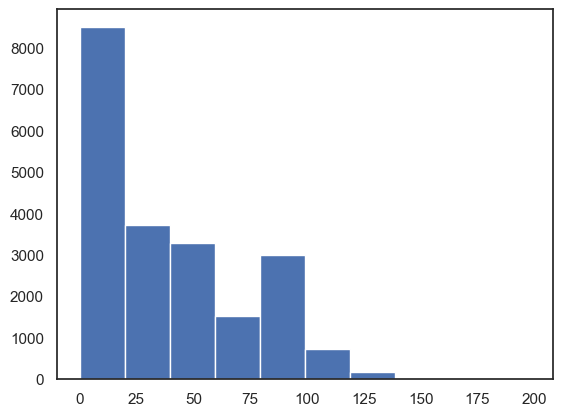

In [83]:
plt.hist(x=df_small_filt['min_distance_fixed'])

In [ ]:
# log min dist fixed for smoothing


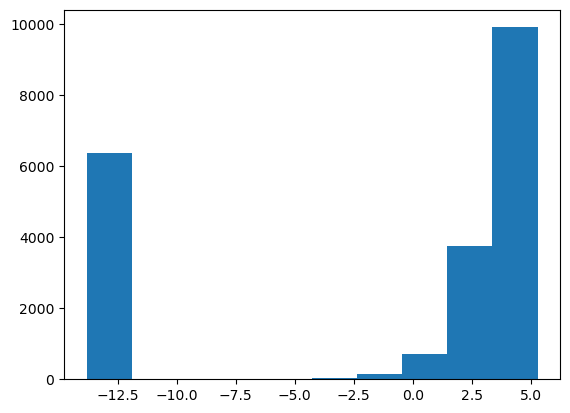

,ppid,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,target_hit,...,sign_label,set_order,ball_pos_x,ball_pos_z,target_position_x,target_position_z,target_angle_90,ball_dist_to_center_cm_radii_fixed,min_distance_fixed,log_min_distance_fixed
24,1,25,baseline,7,-1.759757,0.991754,0.855344,-2.272060,7.635622,True,...,neg,1,0.000000_-0.001535_-0.004585_-0.006102_-0.0076...,0.000000_0.008415_0.025144_0.033460_0.041743_0...,-0.3,1.4,102.094757,0.000001,0.000001,-13.815511
25,1,26,baseline,7,-3.886849,0.889053,2.250366,-0.796395,10.945040,False,...,pos,1,0.000000_0.010246_0.020386_0.040355_0.050188_0...,0.000000_0.020036_0.039863_0.078910_0.098138_0...,0.6,1.4,66.801409,2.195040,2.195040,0.786200
26,1,27,baseline,7,-1.766991,0.991405,2.051739,-1.006504,7.327525,True,...,neg,1,0.000000_-0.014923_-0.022279_-0.036787_-0.0439...,0.000000_0.038016_0.056756_0.093717_0.111944_0...,-0.6,1.4,113.198591,0.000001,0.000001,-13.815511
27,1,28,baseline,7,-6.492173,0.763261,2.402338,-0.635638,16.738358,False,...,pos,1,0.000000_0.015230_0.022719_0.030127_0.044706_0...,0.000000_0.045288_0.067558_0.089587_0.132940_0...,0.3,1.4,77.905243,7.988358,7.988358,2.077985
28,1,29,baseline,8,12.838243,1.696581,1.102959,-2.010131,32.096829,False,...,neg,1,0.000000_-0.004650_-0.013878_-0.018457_-0.0275...,0.000000_0.010002_0.029853_0.039703_0.059256_0...,-0.3,1.4,102.094757,23.346829,23.346829,3.150461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22317,p050,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,False,...,pos,2,0.000000_0.009677_0.014380_0.018997_0.027984_0...,0.000000_0.080898_0.120213_0.158808_0.233944_0...,0.3,1.4,77.905243,4.625844,4.625844,1.531659
22318,p050,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,True,...,pos,2,0.000000_0.022154_0.032883_0.043392_0.063788_0...,0.000000_0.088636_0.131562_0.173609_0.255213_0...,0.3,1.4,77.905243,0.000001,0.000001,-13.815511
22319,p050,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,True,...,neg,2,0.000000_-0.009966_-0.029517_-0.039109_-0.0485...,0.000000_0.025983_0.076955_0.101961_0.126658_0...,-0.6,1.4,113.198591,0.000001,0.000001,-13.815511
22320,p050,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,True,...,pos,2,0.000000_0.010519_0.015658_0.020719_0.030618_0...,0.000000_0.065941_0.098152_0.129878_0.191932_0...,0.3,1.4,77.905243,0.000001,0.000001,-13.815511


In [8]:
# log min distance fixed for future plotting
df_small_filt['log_min_distance_fixed'] = np.log(df_small_filt['min_distance_fixed'])

plt.hist(x=df_small_filt['log_min_distance_fixed'])
plt.show()

df_small_filt


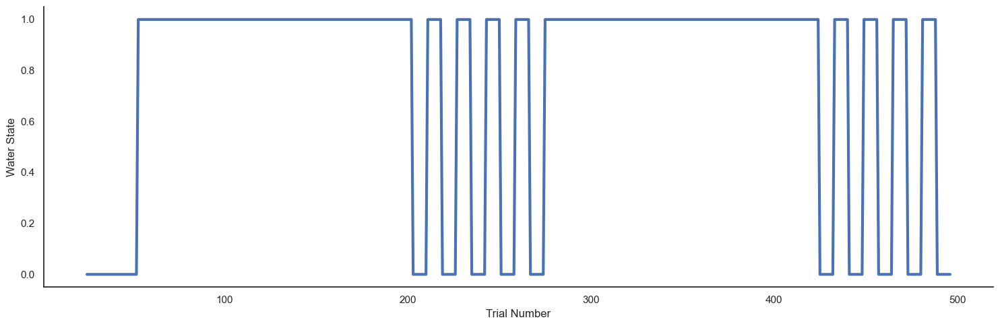

In [423]:
from src.plotting import plot_trial_schedule

# trial schedule plot
g = plot_trial_schedule(df_small, context='poster', font_scale=3)


In [9]:
from src.features import point_of_crossing_x

df_small['error_x_plane'] = df_small.apply(point_of_crossing_x, axis=1)
df_small_filt['error_x_plane'] = df_small.apply(point_of_crossing_x, axis=1)

#df_small_filt.to_csv(r"..\data\R_LMM.csv", index=False)



In [559]:
# number of participants
from src.features import N_by_set_order

N_by_set_order(df_small)

Number of Participants in data: 38
20 ppid in set order 1
18 ppid in set order 2


C:\Users\jacob\water_current_MA\src\features.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = np.array(data.groupby('set_order')['ppid'].nunique().reset_index())


### BASELINE

In [14]:
from src.features import summarize_phase
baseline = summarize_phase(df_small, phase='baseline', y_col='min_distance_fixed')

baseline_filt = summarize_phase(df_small_filt, phase='baseline',  y_col='min_distance_fixed')

baseline

,ppid,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,1,neg0.3,4.603806,0.000001,-0.403429,0.778439,1.607621
1,1,neg0.6,7.875678,0.000001,-0.236629,1.127881,1.633495
2,1,p0.3,3.638294,0.000001,8.061857,-3.802946,2.196611
3,1,p0.6,7.060252,0.000001,11.138014,-4.986574,1.977798
4,p002,neg0.3,4.940755,0.000001,12.996686,-5.037991,2.078754
...,...,...,...,...,...,...,...
175,p049,p0.6,2.366214,0.000001,-3.111000,0.441105,1.295502
176,p050,neg0.3,6.781606,0.000001,1.560771,-0.303010,2.321253
177,p050,neg0.6,8.277757,1.083997,-4.416843,2.345695,2.312106
178,p050,p0.3,7.223075,0.000001,4.822300,-2.277764,1.951460


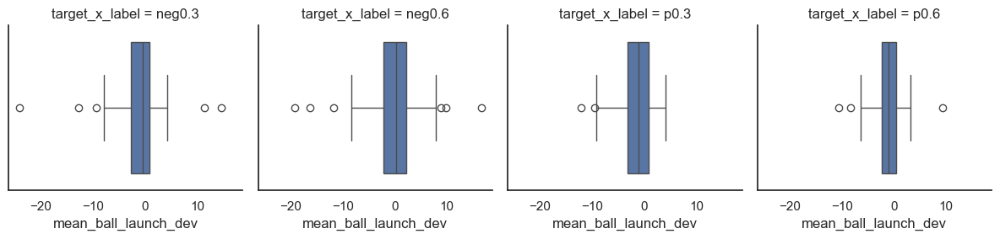

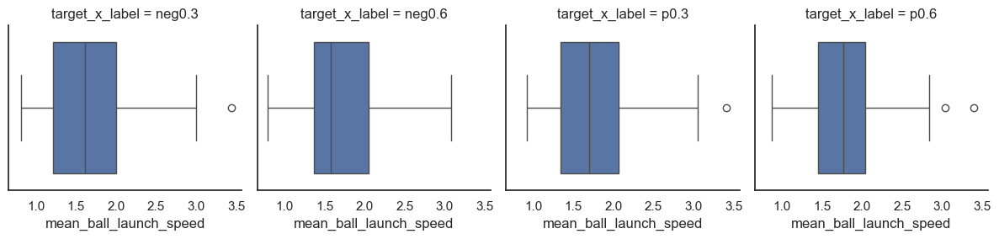

                             OLS Regression Results                             
Dep. Variable:     mean_ball_launch_dev   R-squared:                       0.008
Model:                              OLS   Adj. R-squared:                 -0.009
Method:                   Least Squares   F-statistic:                    0.8136
Date:                  Sat, 15 Nov 2025   Prob (F-statistic):              0.493
Time:                          09:48:16   Log-Likelihood:                -536.93
No. Observations:                   180   AIC:                             1082.
Df Residuals:                       176   BIC:                             1095.
Df Model:                             3                                         
Covariance Type:                cluster                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------

In [31]:
from src.plotting import plot_boxplot_target_error
plot_boxplot_target_error(baseline, measure='mean_ball_launch_dev')


plot_boxplot_target_error(baseline, measure='mean_ball_launch_speed')


mod_base_dev = smf.ols("mean_ball_launch_dev ~  C(target_x_label)",
                  data=baseline).fit(
    cov_type="cluster", cov_kwds={"groups": baseline["ppid"]}
)
print(mod_base_dev.summary())


In [35]:
baseline

,ppid,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,1,neg0.3,4.603806,0.000001,-0.403429,0.778439,1.607621
1,1,neg0.6,7.875678,0.000001,-0.236629,1.127881,1.633495
2,1,p0.3,3.638294,0.000001,8.061857,-3.802946,2.196611
3,1,p0.6,7.060252,0.000001,11.138014,-4.986574,1.977798
4,p002,neg0.3,4.940755,0.000001,12.996686,-5.037991,2.078754
...,...,...,...,...,...,...,...
175,p049,p0.6,2.366214,0.000001,-3.111000,0.441105,1.295502
176,p050,neg0.3,6.781606,0.000001,1.560771,-0.303010,2.321253
177,p050,neg0.6,8.277757,1.083997,-4.416843,2.345695,2.312106
178,p050,p0.3,7.223075,0.000001,4.822300,-2.277764,1.951460


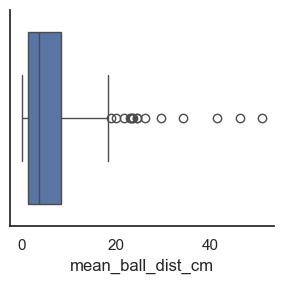

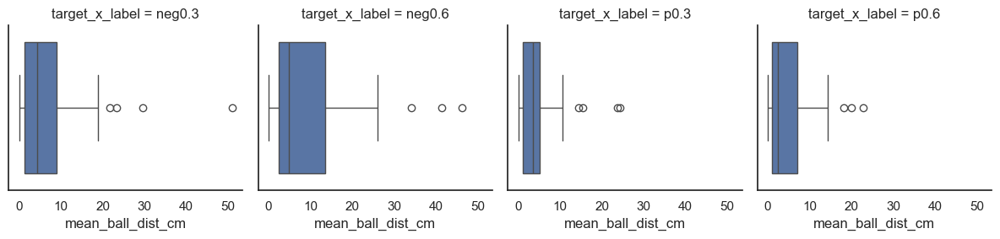

In [34]:
plot_boxplot_target_error(baseline, measure='mean_ball_dist_cm', facet_by_target=False)
plot_boxplot_target_error(baseline, measure='mean_ball_dist_cm')

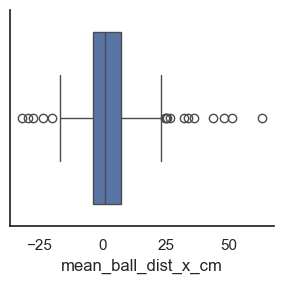

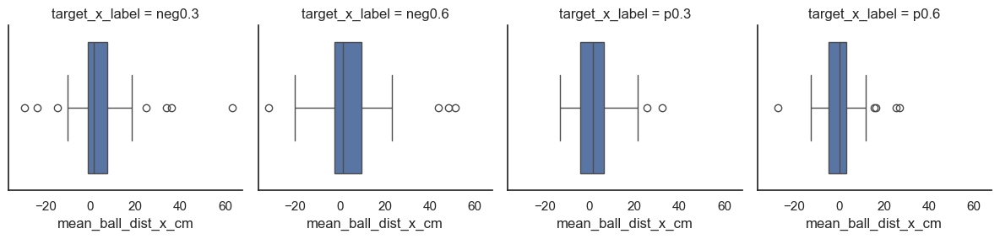

In [96]:
plot_boxplot_target_error(baseline, measure='mean_ball_dist_x_cm', facet_by_target=False)
plot_boxplot_target_error(baseline, measure='mean_ball_dist_x_cm')

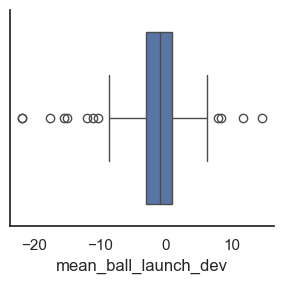

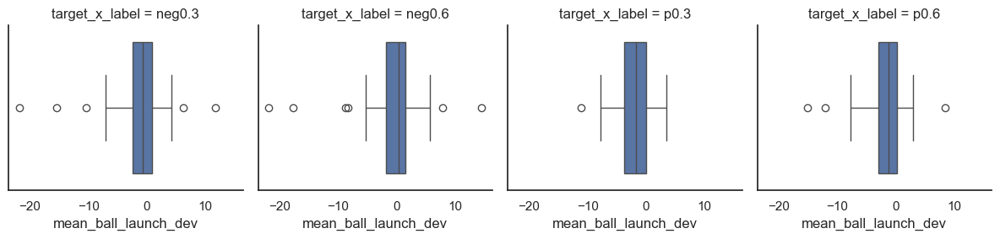

In [277]:
plot_boxplot_target_error(baseline, measure='mean_ball_launch_dev', facet_by_target=False)
plot_boxplot_target_error(baseline, measure='mean_ball_launch_dev')

### BASELINE CORRECTED MIN DISTANCE: maybe make a function to loop through cols?

In [15]:
# combine baseline error back to main df
df_BC = df_small.merge(baseline, on=['ppid', 'target_x_label'], how='left')

df_filt_BC = df_small_filt.merge(baseline_filt, on=['ppid', 'target_x_label'], how='left')


# baseline correct min distance 
df_BC['baseline_corrected_dist'] = df_BC['ball_dist_to_center_cm'] - df_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_BC['baseline_corrected_x'] = df_BC['error_x_plane'] - df_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_BC['baseline_corrected_dev'] = df_BC['launch_deviation'] - df_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_BC['baseline_corrected_speed'] = df_BC['launch_Speed'] - df_BC['mean_ball_launch_speed']


# filtered data baseline correct
df_filt_BC['baseline_corrected_dist'] = df_filt_BC['ball_dist_to_center_cm'] - df_filt_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_filt_BC['baseline_corrected_x'] = df_filt_BC['error_x_plane'] - df_filt_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_filt_BC['baseline_corrected_dev'] = df_filt_BC['launch_deviation'] - df_filt_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_filt_BC['baseline_corrected_speed'] = df_filt_BC['launch_Speed'] - df_filt_BC['mean_ball_launch_speed']


In [ ]:
### FIXED DISTANCE

In [25]:
df_filt_BC['min_distance_fixed']

0         0.000001
1         2.195040
2         0.000001
3         7.988358
4        23.346829
           ...    
20933     4.625844
20934     0.000001
20935     0.000001
20936     0.000001
20937    31.205590
Name: min_distance_fixed, Length: 20938, dtype: float64

In [26]:
# combine baseline error back to main df
df_BC = df_small.merge(baseline, on=['ppid', 'target_x_label'], how='left')

df_filt_BC = df_small_filt.merge(baseline_filt, on=['ppid', 'target_x_label'], how='left')


# baseline correct min distance 
df_BC['min_distance_fixed_BC'] = df_BC['min_distance_fixed'] - df_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_BC['baseline_corrected_x'] = df_BC['error_x_plane'] - df_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_BC['baseline_corrected_dev'] = df_BC['launch_deviation'] - df_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_BC['baseline_corrected_speed'] = df_BC['launch_Speed'] - df_BC['mean_ball_launch_speed']


# filtered data baseline correct
df_filt_BC['min_distance_fixed_BC'] = df_filt_BC['min_distance_fixed'] - df_filt_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_filt_BC['baseline_corrected_x'] = df_filt_BC['error_x_plane'] - df_filt_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_filt_BC['baseline_corrected_dev'] = df_filt_BC['launch_deviation'] - df_filt_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_filt_BC['baseline_corrected_speed'] = df_filt_BC['launch_Speed'] - df_filt_BC['mean_ball_launch_speed']


In [17]:
baseline_filt

,ppid,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,1,neg0.3,4.603806,0.000001,-0.403429,0.778439,1.607621
1,1,neg0.6,7.875678,0.000001,-0.236629,1.127881,1.633495
2,1,p0.3,3.638294,0.000001,8.061857,-3.802946,2.196611
3,1,p0.6,7.060252,0.000001,11.138014,-4.986574,1.977798
4,p002,neg0.3,4.940755,0.000001,12.996686,-5.037991,2.078754
...,...,...,...,...,...,...,...
175,p049,p0.6,2.366214,0.000001,-3.111000,0.441105,1.295502
176,p050,neg0.3,6.781606,0.000001,1.560771,-0.303010,2.321253
177,p050,neg0.6,8.277757,1.083997,-4.416843,2.345695,2.312106
178,p050,p0.3,7.223075,0.000001,4.822300,-2.277764,1.951460


In [51]:
# no baseline data
df_no_baseline_BC = df_filt_BC[df_filt_BC['phase'] != 'baseline'].copy()

In [27]:
df_no_baseline_wash_BC = df_filt_BC[~df_filt_BC['phase'].isin(['baseline', 'washout_1', 'washout_2'])].copy()

In [741]:
baseline_filt

,ppid,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,p000,neg0.3,23.057209,6.355549,16.687057,-6.468969,1.504982
1,p000,neg0.6,15.812623,6.475343,9.813686,-2.971365,1.885979
2,p000,p0.3,19.298343,6.031173,12.630350,-5.582283,1.754842
3,p000,p0.6,11.139143,6.613340,2.874871,-1.944168,1.987985
4,p003,neg0.3,16.001942,7.253315,7.173171,-2.715127,1.451527
...,...,...,...,...,...,...,...
147,p050,p0.6,16.351695,6.180133,12.669257,-5.857698,2.070455
148,p051,neg0.3,16.647904,7.361469,8.286714,-2.976653,0.836755
149,p051,neg0.6,11.637518,7.757881,-6.316286,3.240752,0.979233
150,p051,p0.3,10.670697,6.976257,3.228657,-1.906476,1.043052


In [69]:
df_BC

,ppid,trial_num,phase,trial_num_target,launch_deviation,launch_Speed,ball_dist_to_center_cm,target_hit,water_speed_binary,water_speed_m_s,...,error_x_plane,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,baseline_corrected_dist,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed
0,1,1,baseline,1,-1.155891,2.877647,6.025467,True,0,0.0,...,6.4524,14.660809,6.025467,2.448338,-0.016983,1.796060,-8.635341,4.004062,-1.138908,1.081587
1,1,2,baseline,1,-9.285237,3.028949,23.203476,False,0,0.0,...,23.1997,13.264166,6.576384,6.081500,-2.013530,1.818056,9.939310,17.118200,-7.271707,1.210893
2,1,3,baseline,1,-5.433519,3.173107,14.747873,False,0,0.0,...,11.8783,14.060765,6.206768,6.935623,-3.445993,2.200281,0.687108,4.942677,-1.987526,0.972826
3,1,4,baseline,1,-7.419443,1.929576,18.619847,False,0,0.0,...,17.1628,11.555948,6.052804,7.137177,-3.462434,2.119316,7.063899,10.025623,-3.957008,-0.189740
4,1,5,baseline,2,-6.313191,2.426742,17.174473,False,0,0.0,...,18.2091,14.660809,6.025467,2.448338,-0.016983,1.796060,2.513664,15.760762,-6.296208,0.630682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22315,p050,492,washout_2,122,5.273447,4.112829,13.375844,False,0,0.0,...,-13.5430,29.671025,7.676893,18.272869,-8.702058,1.609071,-16.295181,-31.815869,13.975505,2.503758
22316,p050,493,washout_2,123,-1.938383,4.617405,5.145460,True,0,0.0,...,2.4980,29.671025,7.676893,18.272869,-8.702058,1.609071,-24.525564,-15.774869,6.763675,3.008334
22317,p050,494,washout_2,123,-2.213391,2.782864,7.337979,True,0,0.0,...,8.0769,21.850044,9.833997,7.250223,-2.207187,1.991104,-14.512066,0.826677,-0.006203,0.791760
22318,p050,495,washout_2,124,3.030887,3.364877,7.570455,True,0,0.0,...,-8.3097,29.671025,7.676893,18.272869,-8.702058,1.609071,-22.100570,-26.582569,11.732945,1.755806


In [40]:
df_filt_BC

,ppid,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,target_hit,...,training_phase1,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,baseline_corrected_dist,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed
0,1,25,baseline,7,-1.759757,0.991754,0.855344,-2.272060,7.635622,True,...,False,12.328561,6.576384,-0.403429,0.778439,1.607621,-4.692938,6.094329,-2.538196,-0.752277
1,1,26,baseline,7,-3.886849,0.889053,2.250366,-0.796395,10.945040,False,...,False,15.688498,7.897728,11.138014,-4.986574,1.977798,-4.743458,-1.801114,1.099724,0.272568
2,1,27,baseline,7,-1.766991,0.991405,2.051739,-1.006504,7.327525,True,...,False,15.962263,6.855369,-0.236629,1.127881,1.633495,-8.634738,7.814429,-2.894871,0.418244
3,1,28,baseline,7,-6.492173,0.763261,2.402338,-0.635638,16.738358,False,...,False,11.275529,6.139114,8.061857,-3.802946,2.196611,5.462829,7.460843,-2.689227,0.205727
4,1,29,baseline,8,12.838243,1.696581,1.102959,-2.010131,32.096829,False,...,False,12.328561,6.576384,-0.403429,0.778439,1.607621,19.768268,-29.517371,12.059804,-0.504662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21175,p050,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,False,...,False,15.628552,7.676893,4.822300,-2.277764,1.951460,-2.252708,-18.365300,7.551211,2.161369
21176,p050,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,True,...,False,15.628552,7.676893,4.822300,-2.277764,1.951460,-10.483092,-2.324300,0.339381,2.665945
21177,p050,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,True,...,False,17.027757,9.833997,-4.416843,2.345695,2.312106,-9.689778,12.493743,-4.559086,0.470758
21178,p050,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,True,...,False,15.628552,7.676893,4.822300,-2.277764,1.951460,-8.058097,-13.132000,5.308651,1.413417


In [198]:
df_filt_BC['trial_num'].min()

25

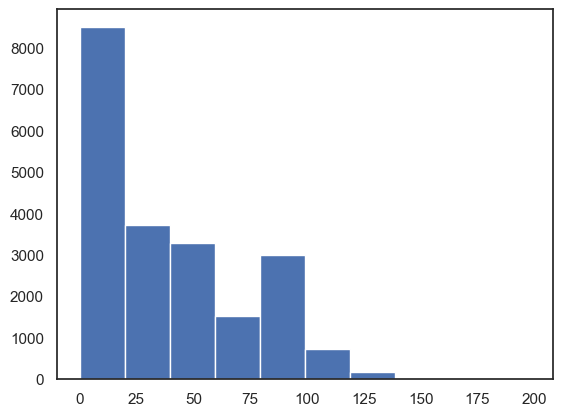

In [39]:
plt.hist(df_filt_BC['ball_dist_to_center_cm'])
plt.show()

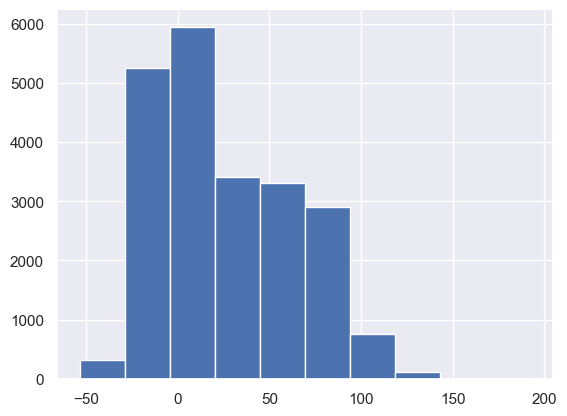

In [79]:
plt.hist(df_filt_BC['baseline_corrected_dist'])
plt.show()

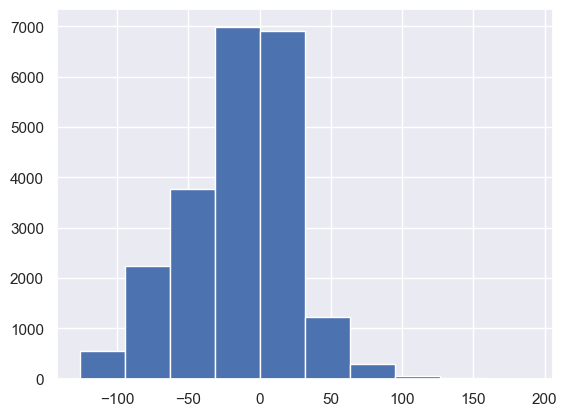

In [87]:
# histogram of baseline errors
plt.hist(df_filt_BC['baseline_corrected_x'])
plt.show()

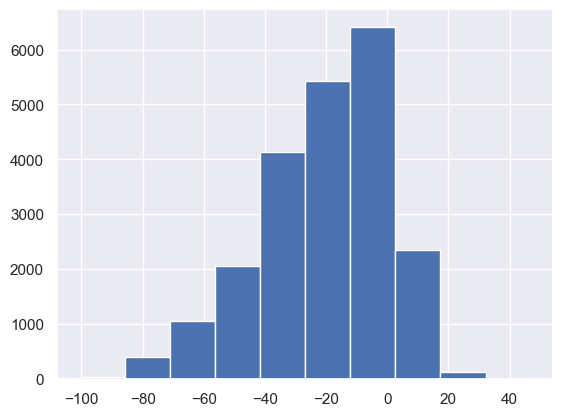

In [89]:
# histogram of baseline errors
plt.hist(df_filt_BC['baseline_corrected_dev'])
plt.show()

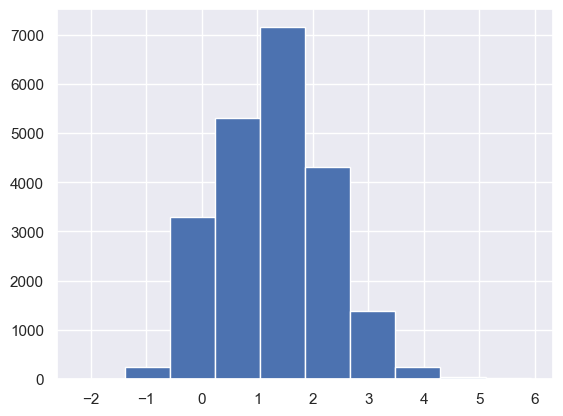

In [91]:
# histogram of baseline errors
plt.hist(df_filt_BC['baseline_corrected_speed'])
plt.show()

In [53]:
baseline

,ppid,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,p000,neg0.3,23.057209,6.355549,16.687057,-6.468969,1.504982
1,p000,neg0.6,15.812623,6.475343,9.813686,-2.971365,1.885979
2,p000,p0.3,41.414935,6.031173,26.899357,-15.431637,1.653630
3,p000,p0.6,11.139143,6.613340,2.874871,-1.944168,1.987985
4,p002,neg0.3,13.433998,6.952707,12.996686,-5.037991,2.078754
...,...,...,...,...,...,...,...
167,p050,p0.6,15.678087,5.923408,-0.366171,-0.728174,2.034437
168,p051,neg0.3,16.647904,7.361469,8.286714,-2.976653,0.836755
169,p051,neg0.6,11.637518,7.757881,-6.316286,3.240752,0.979233
170,p051,p0.3,10.670697,6.976257,3.228657,-1.906476,1.043052


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

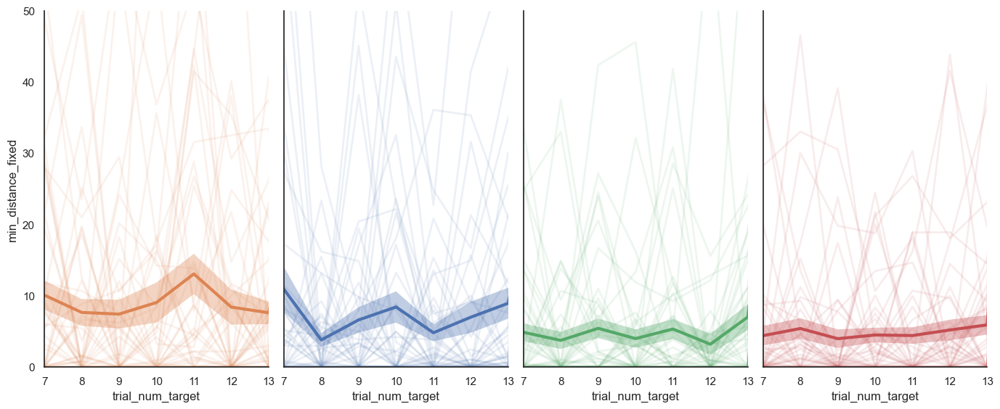

In [40]:
# baseline error plot: 8.75 is likely min
from src.plotting import plot_baseline

plot_baseline(df_filt_BC, context='poster', font_scale=3, y_col='min_distance_fixed')

#plot_baseline(df_small, y_col='launch_deviation', y_lim=(-30,30))

#plot_baseline(df_small, y_col='launch_Speed', y_lim=(0.0,4.0))

In [327]:
df_filt_BC['trial_num'].min()

25

In [ ]:
# boxplot for last half of baseline, check for outliers, four boxplots
# dvs: min distance, lateral error, 
# each ppid is represented once

# plot with

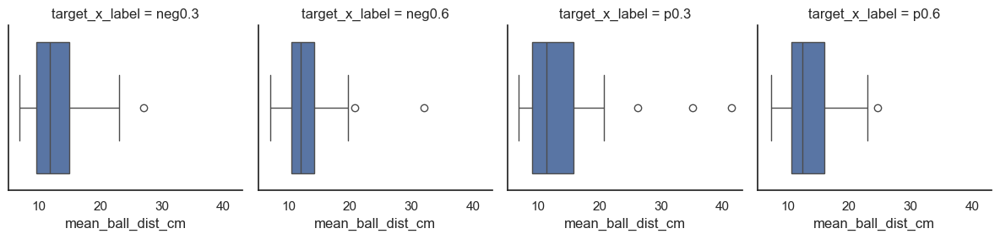

In [410]:
plot_boxplot_target_error(baseline, measure='mean_ball_dist_cm')


In [283]:
ppid_means = (
    baseline
    .groupby(['ppid', 'target_x_label'], as_index=False)['mean_ball_dist_cm']
    .mean()
)

ppid_means.query('mean_ball_dist_cm > 50')


C:\Users\jacob\AppData\Local\Temp\ipykernel_13620\2750927178.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['ppid', 'target_x_label'], as_index=False)['mean_ball_dist_cm']


,ppid,target_x_label,mean_ball_dist_cm
17,p005,neg0.6,55.073916
25,p007,neg0.6,50.131061
160,p046,neg0.3,59.725014


### EXPOSURE - Early to Late: Update function to allow accepting a list of variables to agg?

In [48]:
from src.early_late_exposure import early_late_means

early_late_4_means_euc = early_late_means(
                                            df_filt_BC,
                                            error_col='min_distance_fixed_BC', #baseline_corrected_dist
                                            window_size=4
                                            )
early_late_4_means_euc

C:\Users\jacob\water_current_MA\src\early_late_exposure.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['ppid','phase','target_x_label'])
C:\Users\jacob\water_current_MA\src\early_late_exposure.py:38: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ordered = (df_phase
C:\Users\jacob\water_current_MA\src\early_late_exposure.py:55: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  early_to_late.groupby(['ppid','ta

,ppid,section,target_x_label,set_order,phase,mean_dist,var_dist,n
0,1,early,neg0.3,1,training_2,30.495010,894.824950,4
1,1,early,neg0.6,1,training_1,22.448724,610.588498,4
2,1,early,p0.3,1,training_1,58.859351,145.480499,4
3,1,early,p0.6,1,training_2,77.435012,6.095940,4
4,1,late,neg0.3,1,training_2,24.489741,446.051449,4
...,...,...,...,...,...,...,...,...
355,p050,early,p0.6,2,training_1,85.178062,190.762948,4
356,p050,late,neg0.3,2,training_1,7.190891,277.416623,4
357,p050,late,neg0.6,2,training_2,0.409421,301.868171,4
358,p050,late,p0.3,2,training_2,49.504325,19.066802,4


0        -4.603805
1        -4.865212
2        -7.875677
3         4.350064
4        18.743023
           ...    
20933    -2.597231
20934    -7.223074
20935    -8.277756
20936    -7.223074
20937    22.927834
Name: min_distance_fixed_BC, Length: 20938, dtype: float64

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

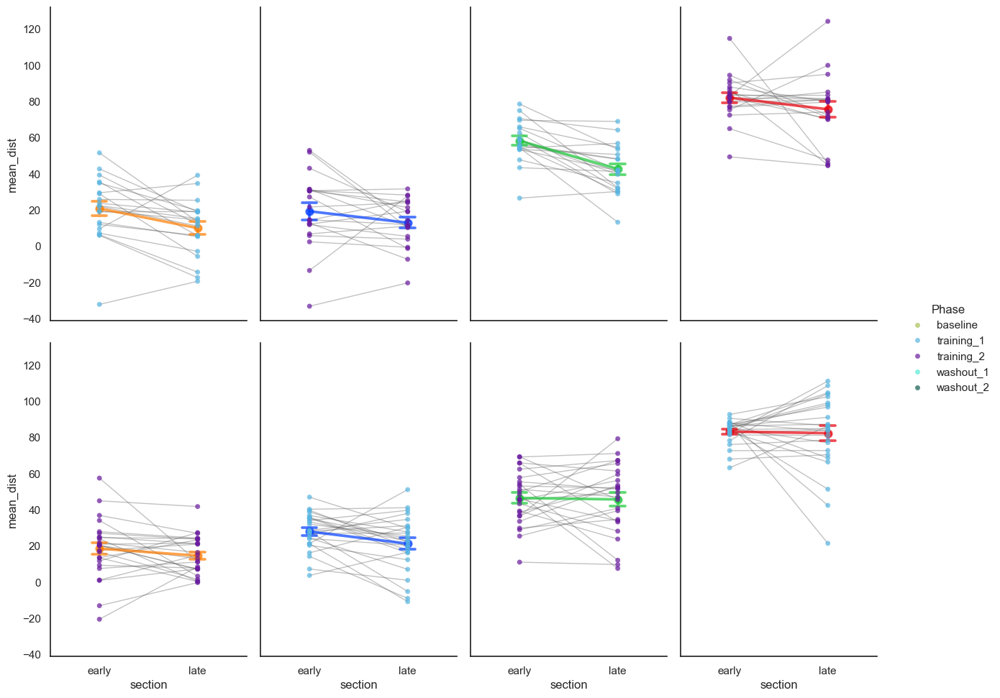

In [49]:
from src.plotting import plot_early_late_exposure

#early_late_4_means['training_status'].unique()


plot_early_late_exposure(early_late_4_means_euc, context='poster', font_scale=3)
#plot_early_late_exposure(early_late_10_means_dev)
#plot_early_late_exposure(early_late_10_means_speed)

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

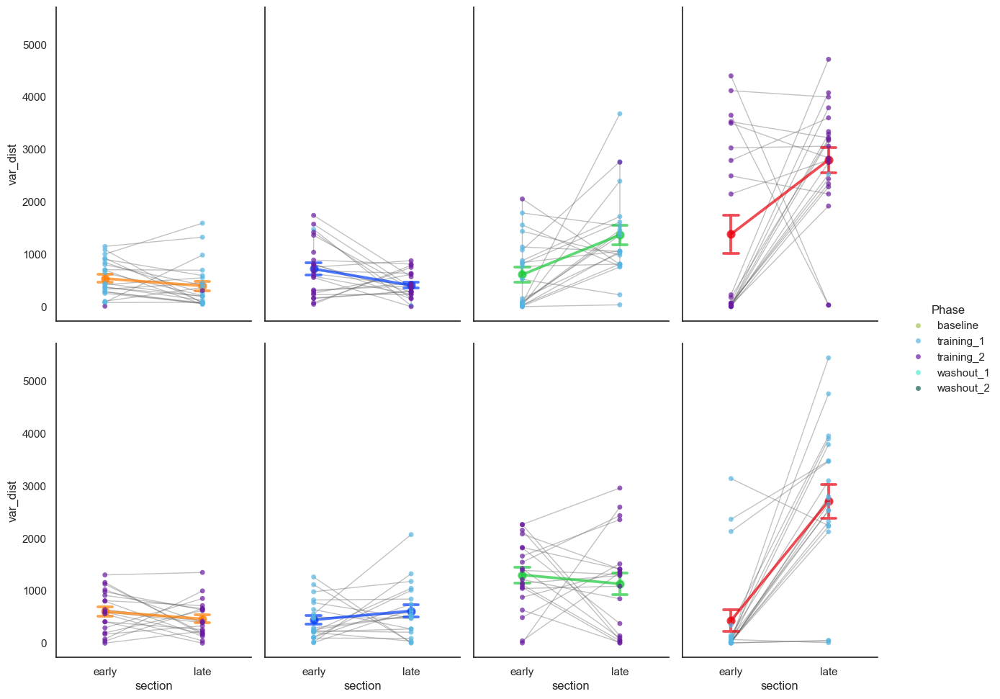

In [418]:
plot_early_late_exposure(early_late_4_means_euc, y_col='var_dist')

In [745]:
# make early_late_10_means_speed using the trained only dataset
early_late_4_means_euc_t1 = early_late_4_means_euc[early_late_4_means_euc['phase'] == 'training_1']

print(early_late_4_means_euc_t1)

# early_late_10_means_trained.to_csv('exposure_early_late_trained.csv', index=False)  
early_late_4_means_euc_t1['n'].max()

     ppid section target_x_label set_order       phase  mean_dist  \
1    p000   early         neg0.6         1  training_1  26.157932   
2    p000   early           p0.3         1  training_1  48.825281   
5    p000    late         neg0.6         1  training_1   4.289273   
6    p000    late           p0.3         1  training_1  39.227206   
9    p003   early         neg0.6         1  training_1  28.985677   
..    ...     ...            ...       ...         ...        ...   
295  p050    late           p0.6         2  training_1  45.901843   
296  p051   early         neg0.3         2  training_1  29.741771   
299  p051   early           p0.6         2  training_1  82.559860   
300  p051    late         neg0.3         2  training_1   8.473843   
303  p051    late           p0.6         2  training_1  47.678618   

        var_dist  n  
1     841.052740  4  
2      65.809435  4  
5     257.596116  4  
6    3680.733667  4  
9     646.728551  4  
..           ... ..  
295  3954.089322 

4

In [149]:
# mixed model (full data)
m = smf.mixedlm("mean_dist ~ section * target_x_label + set_order",
                early_late_4_means_euc,
                groups=early_late_4_means_euc["ppid"])
print(m.fit().summary())


fit = m.fit()

                       Mixed Linear Model Regression Results
Model:                      MixedLM          Dependent Variable:          mean_dist 
No. Observations:           360              Method:                      REML      
No. Groups:                 45               Scale:                       228.2381  
Min. group size:            8                Log-Likelihood:              -1489.0630
Max. group size:            8                Converged:                   Yes       
Mean group size:            8.0                                                     
------------------------------------------------------------------------------------
                                         Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
------------------------------------------------------------------------------------
Intercept                                20.792    2.853  7.287 0.000  15.200 26.384
section[T.late]                          -6.895    3.185 -2.165 0.030 -13.138 -0.653
targ

In [151]:
import statsmodels.formula.api as smf

# ensure 'section' is categorical with levels ['early','late'] (ordered as you intend)
m = smf.mixedlm(
    "mean_dist ~ section * C(target_x_label) + C(set_order)",
    data=early_late_4_means_euc,
    groups=early_late_4_means_euc["ppid"],
    re_formula="~ section"   # random intercept & slope for section
)
res = m.fit(method="lbfgs")
print(res.summary())


                         Mixed Linear Model Regression Results
Model:                       MixedLM           Dependent Variable:           mean_dist 
No. Observations:            360               Method:                       REML      
No. Groups:                  45                Scale:                        228.2143  
Min. group size:             8                 Log-Likelihood:               -1489.0537
Max. group size:             8                 Converged:                    Yes       
Mean group size:             8.0                                                       
---------------------------------------------------------------------------------------
                                            Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
---------------------------------------------------------------------------------------
Intercept                                   20.856    2.895  7.204 0.000  15.182 26.530
section[T.late]                             -6.895    3.1

### ALL EXPOSURE TRIALS

In [103]:
from src.filter_phase import filter_for_phase

training = filter_for_phase(df_filt_BC, phase_key='t', inc_phase=True, expected_n=75)
training_df = training[0]
training_df['trial_num'].min()

C:\Users\jacob\water_current_MA\src\filter_phase.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  selected_phase['phase_trial_target'] = selected_phase.groupby(['ppid', 'phase','target_x_label']).cumcount() + 1
C:\Users\jacob\water_current_MA\src\filter_phase.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  max_check = selected_phase.groupby(['ppid','target_x_label'])['phase_trial_target'].max()


53

In [335]:
df_filt_BC['phase']

0         baseline
1         baseline
2         baseline
3         baseline
4         baseline
           ...    
20933    washout_2
20934    washout_2
20935    washout_2
20936    washout_2
20937    washout_2
Name: phase, Length: 20938, dtype: category
Categories (5, object): ['baseline', 'training_1', 'training_2', 'washout_1', 'washout_2']

# Solution-space heatmap & GAMs

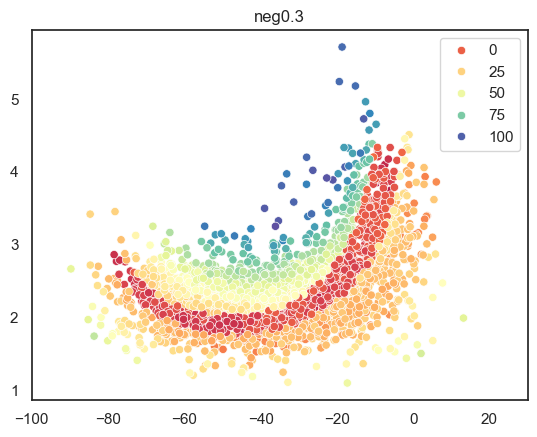

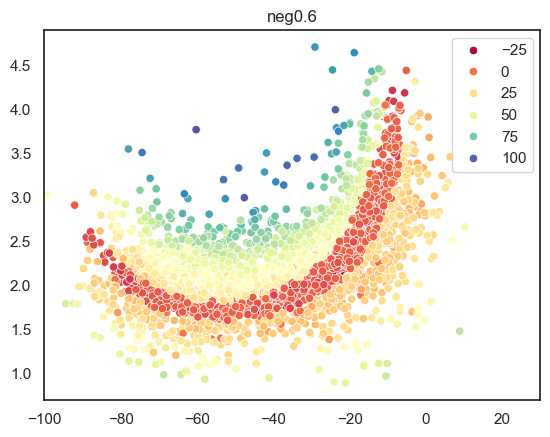

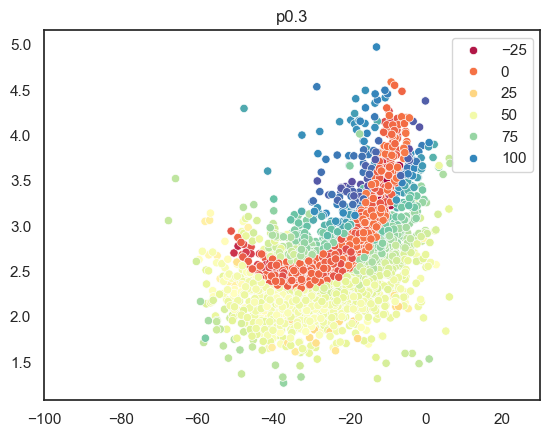

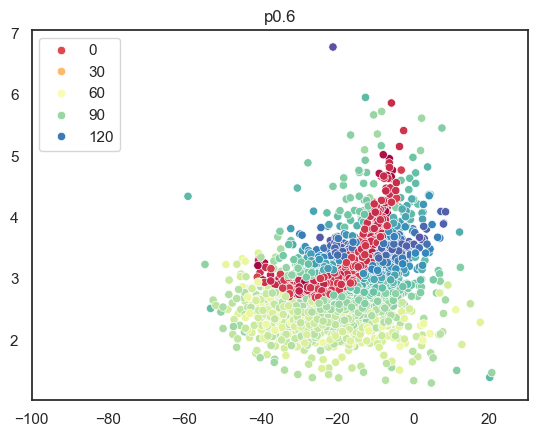

In [751]:
target_labels = np.unique(training_df['target_x_label'])


speeds = np.array(training_df['launch_Speed']) #.reshape(-1,1)
angles = np.array(training_df['launch_deviation'])#.reshape(-1,1)
error = np.array(training_df['baseline_corrected_dist'])#.reshape(-1,1)
targets = np.array(training_df['target_x_label'])#.reshape(-1,1)


for label in target_labels:

    mask = (targets == label)

    errors_masked = error[mask].ravel()

    # launch speeds per target mask
    speeds_masked = speeds[mask].ravel()
         
    # launch deviations per target mask
    angles_masked = angles[mask].ravel()

    plt.figure()
    
    cmap = sns.color_palette("Spectral", as_cmap=True)
    sns.scatterplot(x=angles_masked, y=speeds_masked, hue=errors_masked, palette=cmap)

    plt.xlim(-100,30)

    plt.title(label)
    plt.show()
    

In [755]:
target_labels = np.unique(training_df['target_x_label'])


speeds_z = np.array(training_df['launch_Speed_z']) #.reshape(-1,1)
angles_z = np.array(training_df['launch_dev_z'])#.reshape(-1,1)
error_bc = np.array(training_df['baseline_corrected_dist'])#.reshape(-1,1)
error = np.array(training_df['ball_dist_to_center_cm'])#.reshape(-1,1)
lat_error = np.array(training_df['error_x_plane'])#.reshape(-1,1)

targets = np.array(training_df['target_x_label'])#.reshape(-1,1)


for label in target_labels:

    mask = (targets == label)

    errors_masked = error[mask].ravel()


    # launch speeds per target mask
    speeds_masked = speeds_z[mask].ravel()
    # min
    min_speeds_mask = np.min(speeds_masked)
    # max
    max_speeds_mask = np.max(speeds_masked)
    # range
    range_speeds_mask = max_speeds_mask - min_speeds_mask
    
    # sampled launch speed deviations
    speed_edges = (np.linspace(
                    min_speeds_mask,
                    max_speeds_mask,
                    num=101 # 100 bins
                    )
         )

    print('speed edges:', speed_edges)

    speed_bins = np.digitize(speeds_masked, speed_edges) - 1

         

    # launch deviations per target mask
    angles_masked = angles_z[mask].ravel()
    # min
    min_angles_mask = np.min(angles_masked)
    # max
    max_angles_mask = np.max(angles_masked)
    # range
    range_angles_mask = max_angles_mask - min_angles_mask

    # sampled launch angle deviations
    angle_edges = (np.linspace(
                    min_angles_mask,
                    max_angles_mask,
                    num=101 # 100 bins
                    )
         )
    print('angle edges:', angle_edges)

    angle_bins = np.digitize(angles_masked, angle_edges) - 1
    

    #plt.figure()

    #sns.scatterplot(x=angles_masked, y=speeds_masked, hue=errors_masked)

    #plt.xlim(-100,30)

    #plt.title(label)
    #plt.show()
    

speed edges: [-1.95035869 -1.88335208 -1.81634547 -1.74933886 -1.68233225 -1.61532563
 -1.54831902 -1.48131241 -1.4143058  -1.34729919 -1.28029258 -1.21328597
 -1.14627936 -1.07927275 -1.01226614 -0.94525953 -0.87825291 -0.8112463
 -0.74423969 -0.67723308 -0.61022647 -0.54321986 -0.47621325 -0.40920664
 -0.34220003 -0.27519342 -0.20818681 -0.1411802  -0.07417358 -0.00716697
  0.05983964  0.12684625  0.19385286  0.26085947  0.32786608  0.39487269
  0.4618793   0.52888591  0.59589252  0.66289914  0.72990575  0.79691236
  0.86391897  0.93092558  0.99793219  1.0649388   1.13194541  1.19895202
  1.26595863  1.33296524  1.39997185  1.46697847  1.53398508  1.60099169
  1.6679983   1.73500491  1.80201152  1.86901813  1.93602474  2.00303135
  2.07003796  2.13704457  2.20405119  2.2710578   2.33806441  2.40507102
  2.47207763  2.53908424  2.60609085  2.67309746  2.74010407  2.80711068
  2.87411729  2.9411239   3.00813052  3.07513713  3.14214374  3.20915035
  3.27615696  3.34316357  3.41017018  3

In [667]:
import pygam
import scipy
import progressbar

In [757]:
# ensure angles, speed, and error are flaots
angles_z = np.asarray(angles_z, dtype=float)
speeds_z = np.asarray(speeds_z, dtype=float)
trial_n_z = np.asarray(
error = np.asarray(error, dtype=float)
lat_error = np.asarray(lat_error, dtype=float)
intercept = np.ones(len(error))

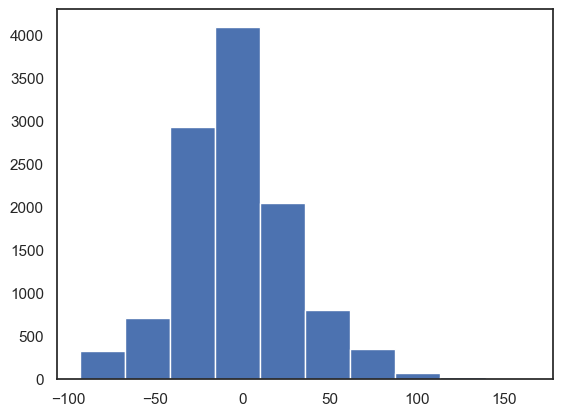

((array([-3.84125604, -3.61779754, -3.49519506, ...,  3.49519506,
          3.61779754,  3.84125604], shape=(11325,)),
  array([-93.2212, -93.1513, -93.1228, ..., 141.2169, 157.4061, 165.119 ],
        shape=(11325,))),
 (np.float64(33.06985351400181),
  np.float64(-2.5598339602649065),
  np.float64(0.9908670097152065)))

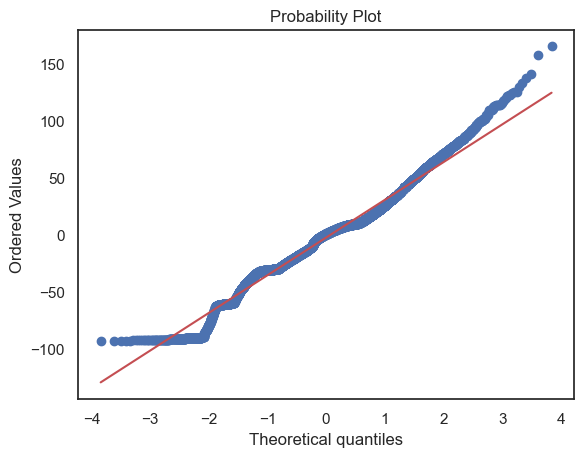

In [707]:
import scipy.stats as stats

plt.hist(lat_error)
plt.show()

stats.probplot(lat_error, dist="norm", plot=plt)


In [709]:
stats.shapiro(lat_error[:5000]) 

ShapiroResult(statistic=np.float64(0.9818867966261505), pvalue=np.float64(8.424234994220266e-25))

In [785]:
tgts = pd.get_dummies(training_df['target_x_label'], prefix='tgt', drop_first=True)


In [793]:
# construct design matrix
X = np.column_stack([angles_z, speeds_z, tgts])
print(X.shape)

Y = lat_error # error
print(Y.shape)

Y_z = (lat_error - lat_error.mean()) / lat_error.std(ddof=0)

(11325, 5)
(11325,)


In [581]:
training_df.groupby(['target_x_label', 'ppid'])[['phase_trial_target','trial_num']].max()

C:\Users\jacob\AppData\Local\Temp\ipykernel_13620\177256837.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  training_df.groupby(['target_x_label', 'ppid'])[['phase_trial_target','trial_num']].max()


phase_trial_target  trial_num
target_x_label ppid                               
neg0.3         p000                  74        423
               p003                  73        424
               p004                  74        201
               p005                  75        202
               p006                  73        201
...                                 ...        ...
p0.6           p047                  75        201
               p048                  74        202
               p049                  75        202
               p050                  75        202
               p051                  75        202

[152 rows x 2 columns]

In [583]:
print(training_df['phase_trial_target'].max())

print(
    training_df.groupby(['target_x_label'])['phase_trial_target']
        .max()
)

print(
    training_df.groupby(['target_x_label', 'phase'])['phase_trial_target']
        .max()
)


75
target_x_label
neg0.3    75
neg0.6    75
p0.3      75
p0.6      75
Name: phase_trial_target, dtype: int64
target_x_label  phase     
neg0.3          baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
neg0.6          baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
p0.3            baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
p0.6            baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
Name: phase_trial_target, dtype: float64


C:\Users\jacob\AppData\Local\Temp\ipykernel_13620\171956076.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  training_df.groupby(['target_x_label'])['phase_trial_target']
C:\Users\jacob\AppData\Local\Temp\ipykernel_13620\171956076.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  training_df.groupby(['target_x_label', 'phase'])['phase_trial_target']


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

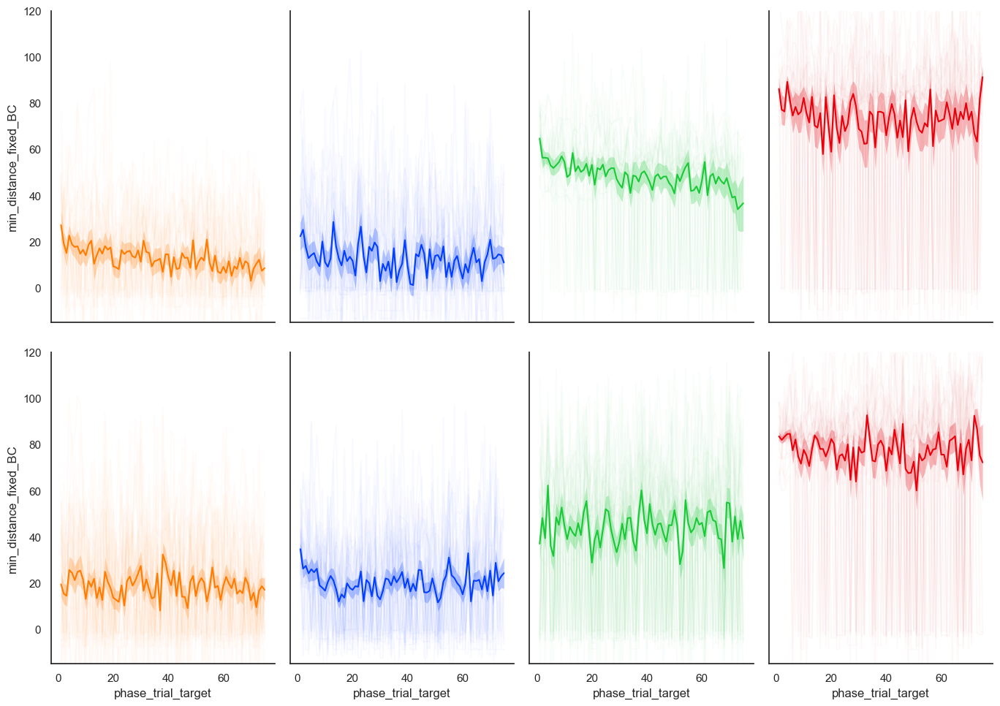

In [51]:
from src.plotting import plot_exposure_trials

plot_exposure_trials(training_df, 
                     y_col = 'min_distance_fixed_BC', 
                     context='poster', 
                     font_scale=3, 
                     estimator='mean', 
                     y_lim=(-15,120)
                    )

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

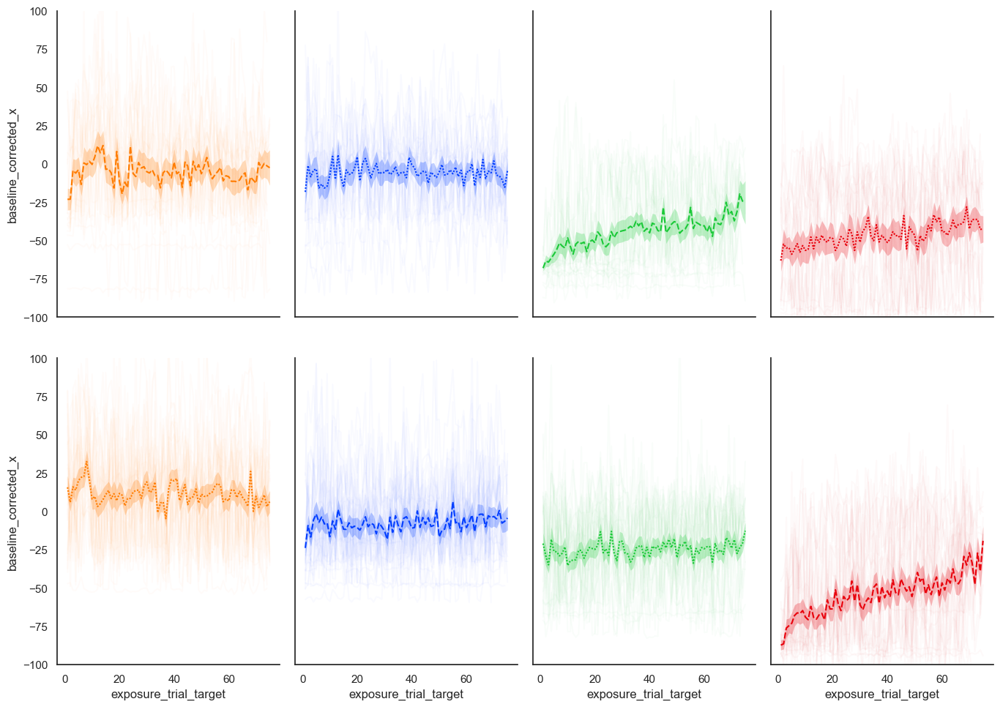

In [247]:

plot_exposure_trials(training, y_col='baseline_corrected_x', y_lim=(-100.0,100.0))

In [106]:
# subset to set_order == 1
df_set1 = training_df[training_df['set_order'] == '1']

import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)


# group by target_x_label and extract the trial numbers
target_trial_map = (
    df_set1.groupby(['target_x_label','phase','ppid'])['trial_num'].count()
)

print(target_trial_map)


target_x_label  phase       ppid
neg0.3          baseline    1        0
                            p002     0
                            p003     0
                            p004     0
                            p005     0
                            p006     0
                            p007     0
                            p009     0
                            p010     0
                            p011     0
                            p014     0
                            p015     0
                            p016     0
                            p017     0
                            p018     0
                            p019     0
                            p020     0
                            p021     0
                            p023     0
                            p025     0
                            p026     0
                            p027     0
                            p028     0
                            p029     0
                            p03

C:\Users\jacob\AppData\Local\Temp\ipykernel_21584\2350898712.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_set1.groupby(['target_x_label','phase','ppid'])['trial_num'].count()


### GENERALIZATION

In [52]:

# makee exposure df with only early trial means
training_gen = early_late_4_means_euc[early_late_4_means_euc['section'] == 'early']

training_gen.head(8)

,ppid,section,target_x_label,set_order,phase,mean_dist,var_dist,n
0,1,early,neg0.3,1,training_2,30.495010,894.824950,4
1,1,early,neg0.6,1,training_1,22.448724,610.588498,4
2,1,early,p0.3,1,training_1,58.859351,145.480499,4
3,1,early,p0.6,1,training_2,77.435012,6.095940,4
8,p002,early,neg0.3,2,training_1,24.189625,60.795830,4
9,p002,early,neg0.6,2,training_2,24.050892,54.405359,4
10,p002,early,p0.3,2,training_2,66.042471,365.630193,4
11,p002,early,p0.6,2,training_1,84.452157,5.764656,4


In [87]:
# save exposure data to CSV; may not need if we can run R functions here...
training_gen.to_csv('training_gen_f4.csv', index=False)  


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#4c72b0'` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#4c72b0'` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#4c72b0'` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color=

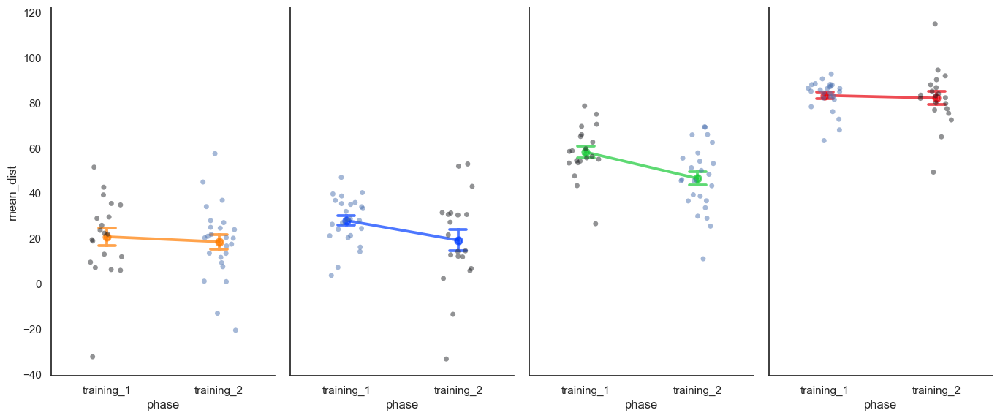

In [53]:
from src.plotting import plot_generalization

plot_generalization(training_gen, context='poster', font_scale=3)

In [345]:
ppid_means = (
    training_gen
    .groupby(['ppid', 'phase', 'target_x_label'], as_index=False)['mean_dist']
    .mean()
)

ppid_means.query('mean_dist < -30')


C:\Users\jacob\AppData\Local\Temp\ipykernel_13620\2037912638.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['ppid', 'phase', 'target_x_label'], as_index=False)['mean_dist']


,ppid,phase,target_x_label,mean_dist
125,p007,training_1,neg0.6,-35.467465
808,p046,training_2,neg0.3,-33.400393


In [ ]:
### WASHOUT

In [623]:
df_filt_BC.columns

Index(['ppid', 'trial_num', 'phase', 'trial_num_target', 'launch_deviation',
       'launch_Speed', 'ball_dist_to_center_cm', 'target_hit',
       'water_speed_binary', 'water_speed_m_s', 'target_x_label', 'sign_label',
       'set_order', 'ball_pos_x', 'ball_pos_z', 'target_position_x',
       'target_position_z', 'target_angle_90', 'error_x_plane',
       'mean_ball_dist_cm', 'min_ball_dist_cm', 'mean_ball_dist_x_cm',
       'mean_ball_launch_dev', 'mean_ball_launch_speed',
       'baseline_corrected_dist', 'baseline_corrected_x',
       'baseline_corrected_dev', 'baseline_corrected_speed'],
      dtype='object')

In [54]:
from src.filter_phase import filter_for_phase
baseline_washout_dfs = filter_for_phase(df_filt_BC, phase_key=['b','w'], block=True, block_len = 4, inc_phase=False)
baseline_washout_df = baseline_washout_dfs[0]

baseline_washout_df['error_x_plane']


C:\Users\jacob\water_current_MA\src\filter_phase.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  selected_phase['phase_trial_target'] = selected_phase.groupby(['ppid', 'target_x_label']).cumcount() + 1
C:\Users\jacob\water_current_MA\src\filter_phase.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  max_check = selected_phase.groupby(['ppid','target_x_label'])['phase_trial_target'].max()


0         5.6909
4       -29.9208
9        -4.7159
12       17.7359
19        6.0169
          ...   
20709   -90.6506
20712   -12.9269
20713     4.4001
20716    -2.5875
20718   -23.5689
Name: error_x_plane, Length: 7697, dtype: float64

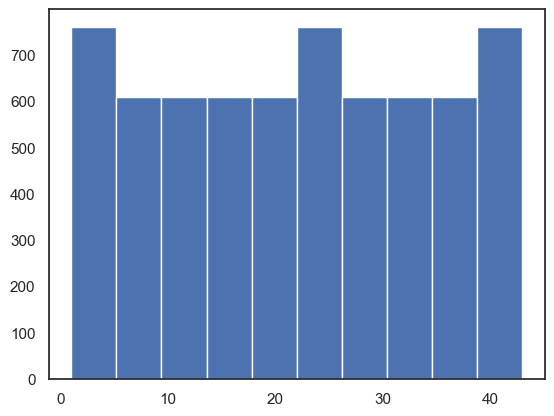

In [595]:
plt.hist(baseline_washout_df['phase_trial_target'])
plt.show()

In [535]:
# find all (ppid, target_x_label) groups with >43 trials
overfilled = (
    baseline_washout_df
    .groupby(['ppid', 'target_x_label'], observed=True)['phase_trial_target']
    .max()
)
overfilled = overfilled[overfilled > 43]
print(overfilled)


ppid  target_x_label
p030  neg0.3            86
      neg0.6            86
      p0.3              86
      p0.6              86
Name: phase_trial_target, dtype: int64


In [617]:
baseline_washout_df

,experiment,ppid,session_num,trial_num,block_num,trial_num_in_block,start_time,end_time,hand,target_hit,...,launch_dev_z,launch_Speed_z,set_order,sign_label,side,target_hit_binary,trial_num_target,target_x_label,phase,phase_trial_target
25,projectile_experiment,p000,1,26,7,2,215.2137,220.1700,r,False,...,-0.333742,-1.893890,1,neg,Downstream,0,7,neg0.3,baseline,1
30,projectile_experiment,p000,1,31,8,3,237.1686,240.8020,r,False,...,0.759308,-1.205768,1,neg,Downstream,0,8,neg0.3,baseline,2
33,projectile_experiment,p000,1,34,9,2,248.4872,252.2879,r,False,...,0.648731,-1.566740,1,neg,Downstream,0,9,neg0.3,baseline,3
39,projectile_experiment,p000,1,40,10,4,271.8066,275.3427,r,True,...,1.151838,-0.359278,1,neg,Downstream,1,10,neg0.3,baseline,4
42,projectile_experiment,p000,1,43,11,3,282.4431,285.9653,r,False,...,1.388841,-0.503915,1,neg,Downstream,0,11,neg0.3,baseline,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19608,S2-projectile_experiment,p051,1,265,120,1,1222.0260,1225.8000,r,True,...,-0.546826,0.762541,2,pos,Upstream,1,120,p0.6,washout_1,39
19611,S2-projectile_experiment,p051,1,268,121,2,1233.3870,1236.9370,r,True,...,1.002002,-1.086277,2,pos,Upstream,1,121,p0.6,washout_1,40
19612,S2-projectile_experiment,p051,1,269,122,1,1236.9370,1240.9460,r,True,...,1.132759,-1.207260,2,pos,Upstream,1,122,p0.6,washout_1,41
19614,S2-projectile_experiment,p051,1,271,123,1,1244.8730,1248.7430,r,True,...,1.060241,-1.168070,2,pos,Upstream,1,123,p0.6,washout_1,42


In [55]:
baseline_washout_df.columns

Index(['ppid', 'trial_num', 'phase', 'trial_num_target', 'launch_deviation',
       'launch_dev_z', 'launch_Speed', 'launch_Speed_z',
       'ball_dist_to_center_cm', 'target_hit', 'water_speed_binary',
       'water_speed_m_s', 'target_x_label', 'sign_label', 'set_order',
       'ball_pos_x', 'ball_pos_z', 'target_position_x', 'target_position_z',
       'target_angle_90', 'ball_dist_to_center_cm_radii_fixed',
       'min_distance_fixed', 'error_x_plane', 'mean_ball_dist_cm',
       'min_ball_dist_cm', 'mean_ball_dist_x_cm', 'mean_ball_launch_dev',
       'mean_ball_launch_speed', 'min_distance_fixed_BC',
       'baseline_corrected_x', 'baseline_corrected_dev',
       'baseline_corrected_speed', 'phase_trial_target', 'block'],
      dtype='object')

In [56]:
baseline_washout_df['launch_deviation'] = -baseline_washout_df['launch_deviation']


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

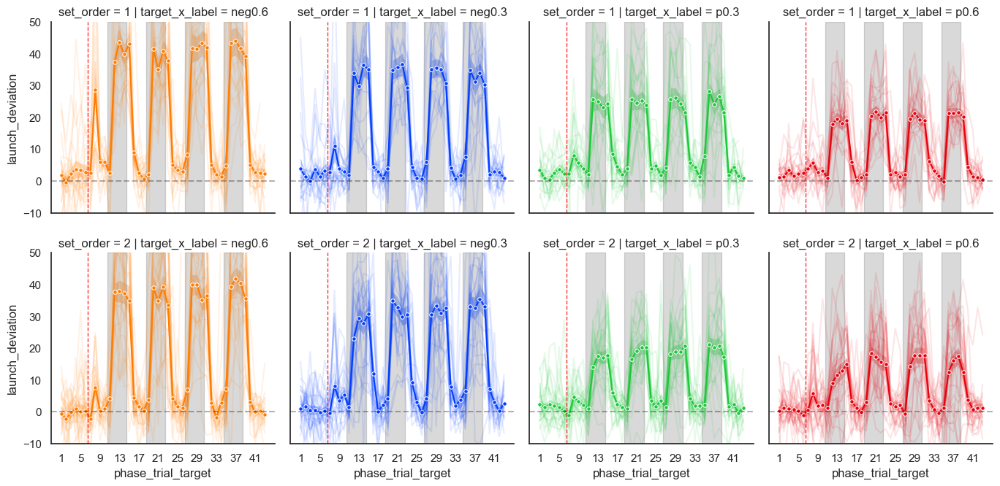

In [60]:
from src.plotting import plot_baseline_washout

plot_baseline_washout(baseline_washout_df,
                      y_col='launch_deviation',
                      show_hits=False
                     )

In [643]:
print(baseline_washout_df['phase_trial_target'].min())
print(baseline_washout_df['phase_trial_target'].max())

1
43


C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

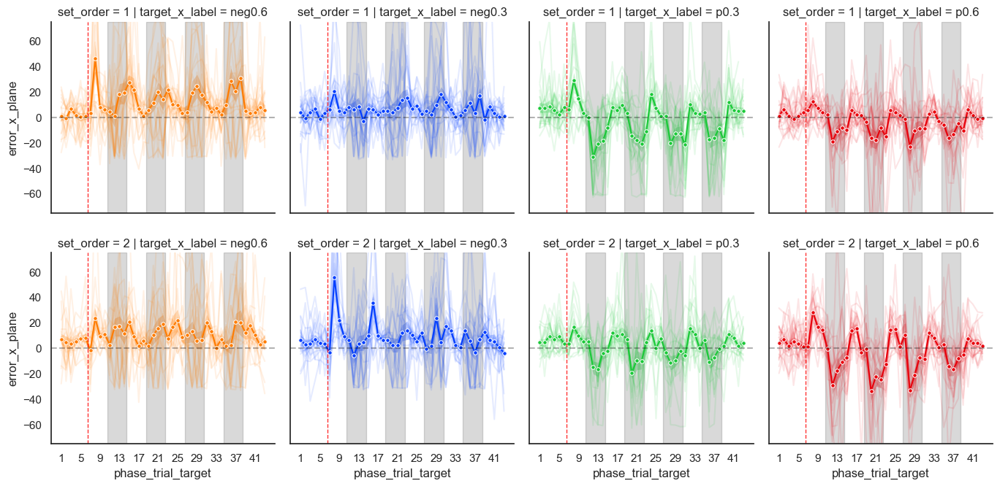

In [645]:
plot_baseline_washout(baseline_washout_df,
                      y_col='error_x_plane',
                      y_lim=(-75,75)
                     )

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

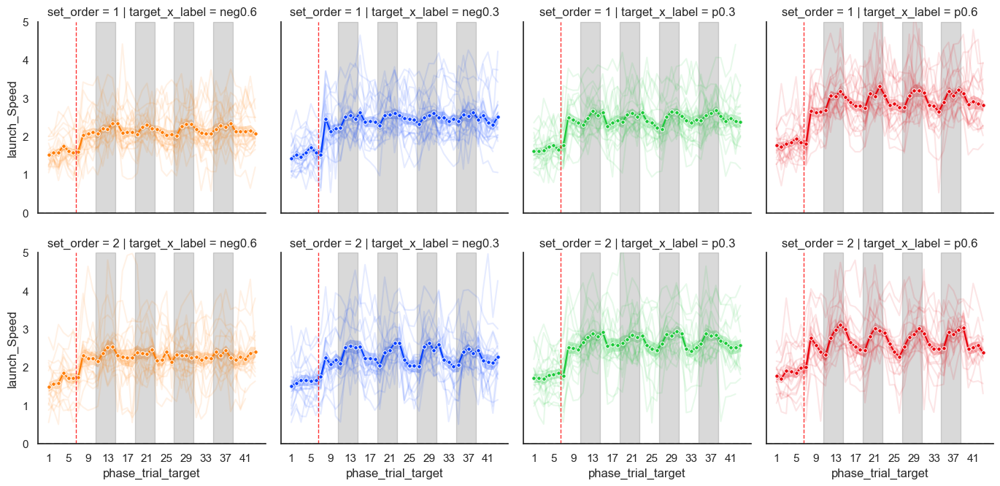

In [657]:
plot_baseline_washout(baseline_washout_df,
                      y_col='launch_Speed',
                      y_lim=(0,5)
                     )

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

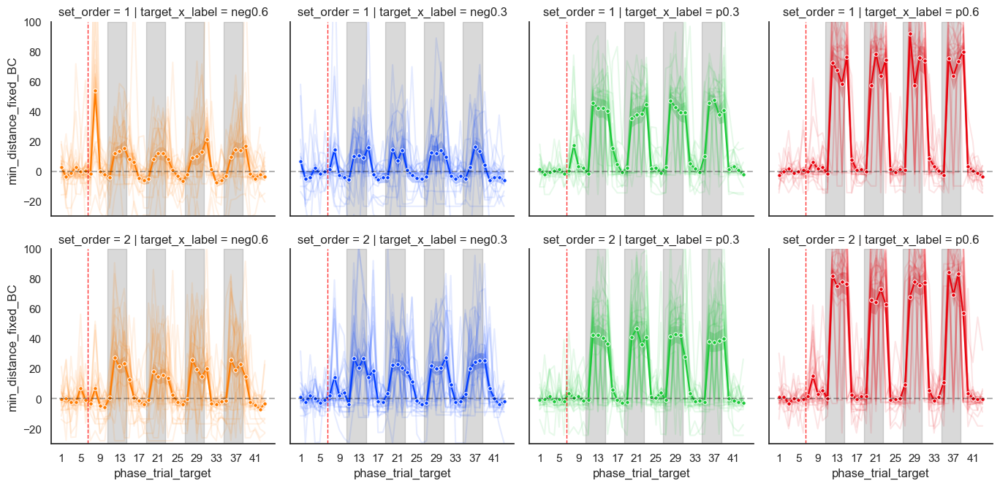

In [62]:

plot_baseline_washout(baseline_washout_df,
                      y_col='min_distance_fixed_BC',
                      y_lim=(-30,100)
                     )

In [649]:
print(baseline_washout_df.groupby(['phase'])['phase_trial_target'].max())
print(baseline_washout_df['phase_trial_target'].min())

phase
baseline       7.0
training_1     NaN
training_2     NaN
washout_1     43.0
washout_2     43.0
Name: phase_trial_target, dtype: float64
1


C:\Users\jacob\AppData\Local\Temp\ipykernel_13620\3425772997.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(baseline_washout_df.groupby(['phase'])['phase_trial_target'].max())


In [286]:
baseline_washout_df_hits = baseline_washout_df[baseline_washout_df['target_hit'] == 'True']
np.unique(baseline_washout_df_hits['target_hit'])

array(['True'], dtype=object)

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

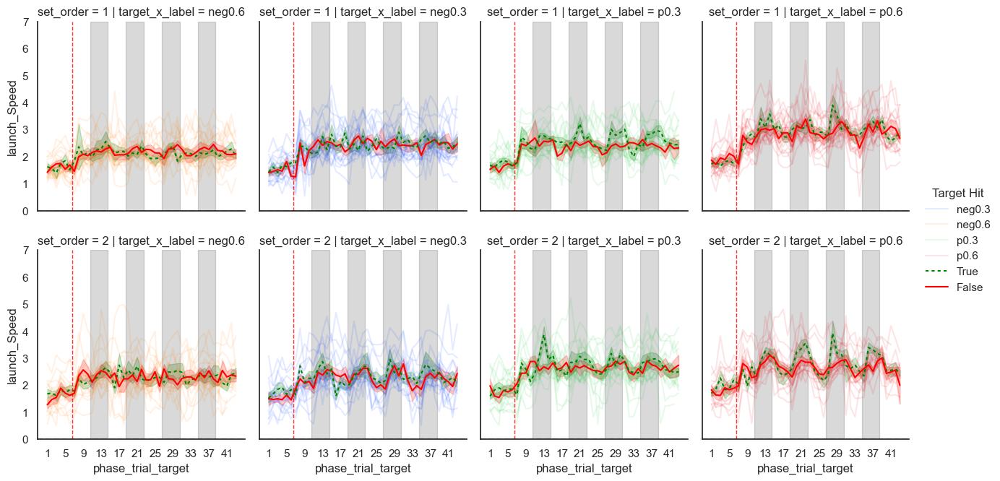

In [651]:
plot_baseline_washout(baseline_washout_df,
                      y_col='launch_Speed',
                      y_lim=(0,7),
                      marker_size=0,
                      show_hits=True
                     )

In [352]:
np.unique(baseline_washout_df['target_hit'])

array(['False', 'True'], dtype=object)

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

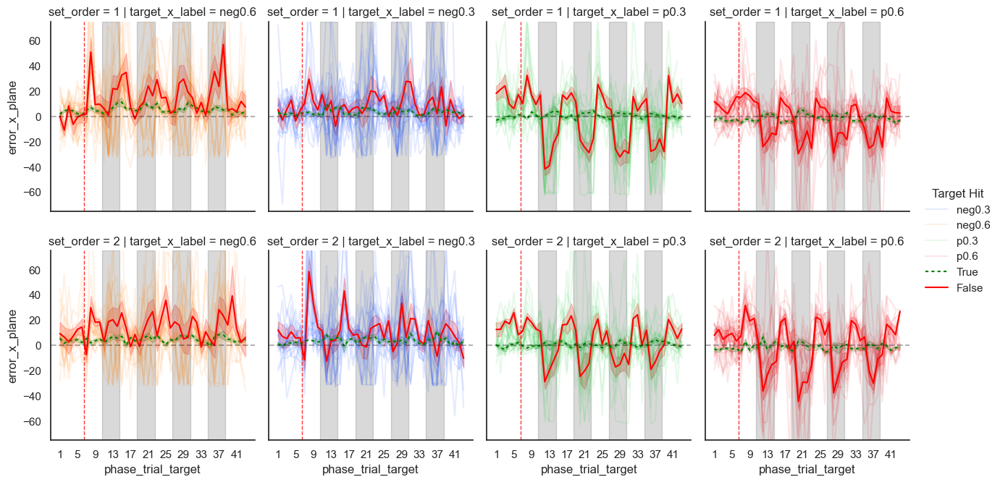

In [653]:
plot_baseline_washout(baseline_washout_df,
                      y_col='error_x_plane',
                      y_lim=(-75,75),
                      marker_size=0,
                      show_hits=True
                     )

In [397]:
baseline_washout_df['launch_deviation'] = -baseline_washout_df['launch_deviation']

In [41]:
# timing
cols = ['step_0_time', 'step_1_time', 'ball_dist_to_center_cm', 'water_speed_binary', 'target_x_label']
df_time = df[cols].copy()

df_time['delta_step_0_1'] = df['step_1_time'] - df['step_0_time']
df_time


,step_0_time,step_1_time,ball_dist_to_center_cm,water_speed_binary,target_x_label,delta_step_0_1
0,32.76032,68.93999,32.167989,0,p0.3,36.17967
1,72.30322,78.06000,14.809713,0,p0.6,5.75678
2,82.07687,91.63000,16.184854,0,neg0.6,9.55313
3,96.22158,98.15000,7.246000,0,neg0.3,1.92842
4,101.33090,104.06000,9.792754,0,neg0.3,2.72910
...,...,...,...,...,...,...
15851,2285.27800,2285.94000,7.516638,0,p0.3,0.66200
15852,2288.63300,2289.53000,7.041025,0,p0.3,0.89700
15853,2292.11400,2293.39000,11.837030,0,neg0.6,1.27600
15854,2296.17900,2297.10000,7.110907,0,neg0.6,0.92100


C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

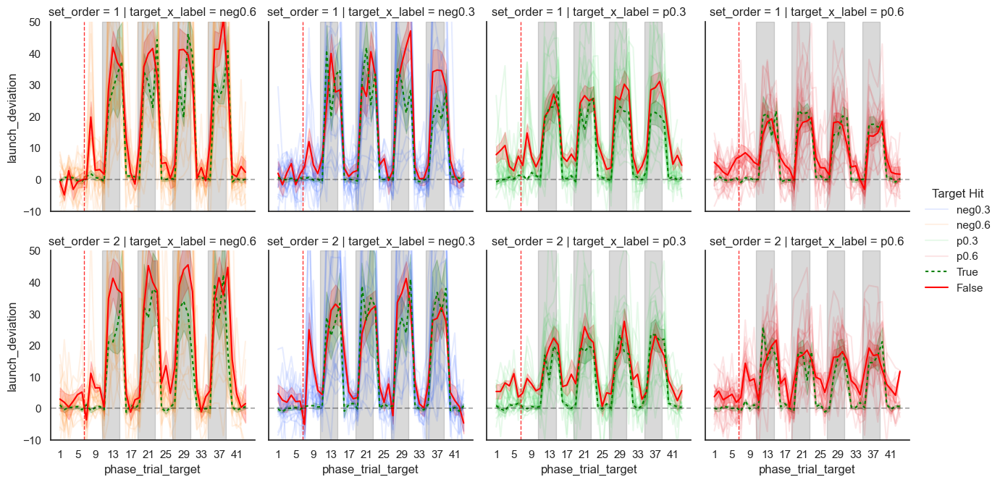

In [655]:
plot_baseline_washout(baseline_washout_df,
                      y_col='launch_deviation',
                      marker_size=0,
                      show_hits=True
                     )

In [79]:
np.sum(df_no_baseline_wash_BC['min_distance_fixed'] < 0)

0

In [ ]:
### AUTOREGRESSIVE MODEL

In [28]:
# add standardized form of trial_num_target to df_small_filt


# df_no_baseline_wash_BC



df_no_baseline_wash_BC['trial_num_target_z'] = (df_no_baseline_wash_BC['trial_num_target'].mean() - df_no_baseline_wash_BC['trial_num_target']) / df_no_baseline_wash_BC['trial_num_target'].std()

#training_df['trial_num_target_z'] = (training_df['trial_num_target'].mean() - training_df['trial_num_target']) / training_df['trial_num_target'].std()


In [29]:
# trained vs transfer
df_no_baseline_wash_BC["training_phase1"] = df_no_baseline_wash_BC["phase"].isin(["training_1"])
df_no_baseline_wash_BC

# sign
df_no_baseline_wash_BC["sign"] = np.where(df_no_baseline_wash_BC["target_x_label"].str.contains("neg"), "left", "right")
df_no_baseline_wash_BC["sign"] = df_no_baseline_wash_BC["sign"].astype("category")


df_no_baseline_wash_BC['strategy_ratio'] = (
    df_no_baseline_wash_BC['launch_dev_z'].abs() /
    (df_no_baseline_wash_BC['launch_dev_z'].abs() + df_no_baseline_wash_BC['launch_Speed_z'].abs())
) # if strategy_ratio = 1.0, mostly came from angle changes

sr = df_no_baseline_wash_BC['strategy_ratio']
df_no_baseline_wash_BC['strategy_ratio_z'] = (sr - sr.mean()) / sr.std()

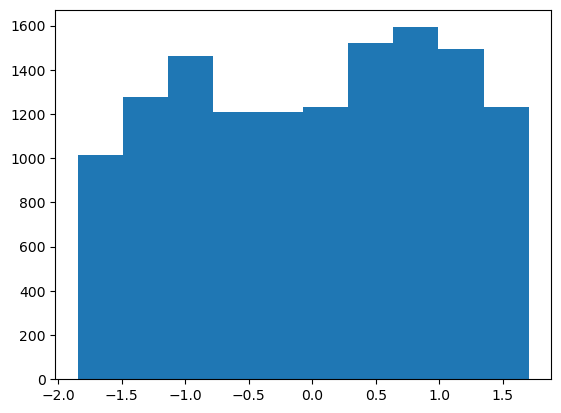

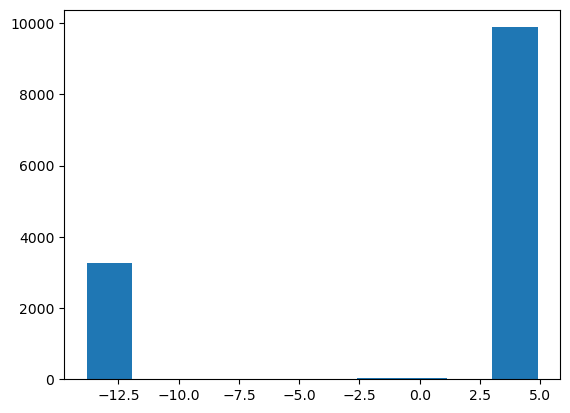

In [30]:
plt.hist(x=df_no_baseline_wash_BC['strategy_ratio_z'])
plt.show()
plt.hist(x=df_no_baseline_wash_BC['log_min_distance_fixed'])
plt.show()


(array([3361., 1548., 1257., 1337., 1943.,  589., 2101.,  707.,  270.,
         128.]),
 array([1.00000000e-06, 1.32726931e+01, 2.65453852e+01, 3.98180773e+01,
        5.30907694e+01, 6.63634616e+01, 7.96361537e+01, 9.29088458e+01,
        1.06181538e+02, 1.19454230e+02, 1.32726922e+02]),
 <BarContainer object of 10 artists>)

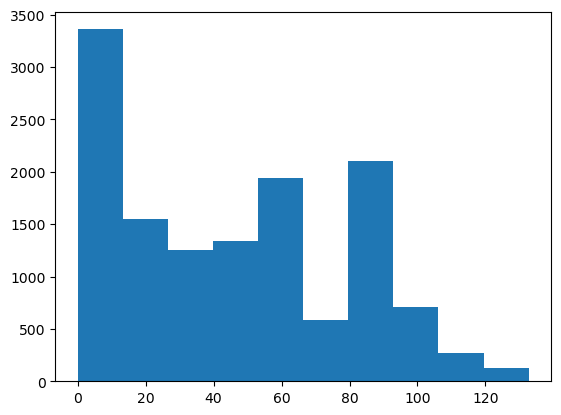

In [31]:
plt.hist(x=df_no_baseline_wash_BC['min_distance_fixed'])

In [42]:
from src.design_matrix import build_design_matrix

X_sm, y, lag_series = build_design_matrix(df_small_filt, 
         x_cols=['trial_num_target_z','launch_dev_z','launch_Speed_z'],
         y_col='ball_dist_to_center_cm',
         n_lag=2,
         group_cols=['ppid','target_x_label','phase'],
         x_dummys=['set_order','phase','target_x_label','water_speed_binary','set_order'],
         interactions=[('launch_dev_z','launch_Speed_z')]
        )


C:\Users\jacob\water_current_MA\src\design_matrix.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df2[lag_col] = df2.groupby(group_cols)[y_col].shift(n_lag)


In [59]:

X_sm = X_sm.astype(float)
y = y.astype(float)
var_y = y.std()
print(var_y)

df_m = pd.concat([y, X_sm], axis=1)



36.222691309093335


In [147]:
df_small_filt

,ppid,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,target_hit,...,water_speed_m_s,target_x_label,sign_label,set_order,ball_pos_x,ball_pos_z,target_position_x,target_position_z,target_angle_90,error_x_plane
24,1,25,baseline,7,-1.759757,0.991754,0.855344,-2.272060,7.635622,True,...,0.0,neg0.3,neg,1,0.000000_-0.001535_-0.004585_-0.006102_-0.0076...,0.000000_0.008415_0.025144_0.033460_0.041743_0...,-0.3,1.4,102.094757,5.6909
25,1,26,baseline,7,-3.886849,0.889053,2.250366,-0.796395,10.945040,False,...,0.0,p0.6,pos,1,0.000000_0.010246_0.020386_0.040355_0.050188_0...,0.000000_0.020036_0.039863_0.078910_0.098138_0...,0.6,1.4,66.801409,9.3369
26,1,27,baseline,7,-1.766991,0.991405,2.051739,-1.006504,7.327525,True,...,0.0,neg0.6,neg,1,0.000000_-0.014923_-0.022279_-0.036787_-0.0439...,0.000000_0.038016_0.056756_0.093717_0.111944_0...,-0.6,1.4,113.198591,7.5778
27,1,28,baseline,7,-6.492173,0.763261,2.402338,-0.635638,16.738358,False,...,0.0,p0.3,pos,1,0.000000_0.015230_0.022719_0.030127_0.044706_0...,0.000000_0.045288_0.067558_0.089587_0.132940_0...,0.3,1.4,77.905243,15.5227
28,1,29,baseline,8,12.838243,1.696581,1.102959,-2.010131,32.096829,False,...,0.0,neg0.3,neg,1,0.000000_-0.004650_-0.013878_-0.018457_-0.0275...,0.000000_0.010002_0.029853_0.039703_0.059256_0...,-0.3,1.4,102.094757,-29.9208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22317,p050,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,False,...,0.0,p0.3,pos,2,0.000000_0.009677_0.014380_0.018997_0.027984_0...,0.000000_0.080898_0.120213_0.158808_0.233944_0...,0.3,1.4,77.905243,-13.5430
22318,p050,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,True,...,0.0,p0.3,pos,2,0.000000_0.022154_0.032883_0.043392_0.063788_0...,0.000000_0.088636_0.131562_0.173609_0.255213_0...,0.3,1.4,77.905243,2.4980
22319,p050,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,True,...,0.0,neg0.6,neg,2,0.000000_-0.009966_-0.029517_-0.039109_-0.0485...,0.000000_0.025983_0.076955_0.101961_0.126658_0...,-0.6,1.4,113.198591,8.0769
22320,p050,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,True,...,0.0,p0.3,pos,2,0.000000_0.010519_0.015658_0.020719_0.030618_0...,0.000000_0.065941_0.098152_0.129878_0.191932_0...,0.3,1.4,77.905243,-8.3097


In [209]:

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri

pandas2ri.activate()

ro.globalenv["df_no_baseline_wash_BC_R"] = pandas2ri.py2rpy(df_no_baseline_wash_BC) # df_no_baseline_BC
#ro.globalenv["training_df_R"] = pandas2ri.py2rpy(training_df)


In [238]:
## final look at pandas df:
df_no_baseline_wash_BC['log_min_distance_fixed'].head(8)

28     4.065996
29     3.159701
30     4.375657
31     4.042294
32   -13.815511
33     4.124508
34     3.674048
35     3.536781
Name: log_min_distance_fixed, dtype: float64

In [211]:
%%R
df_no_baseline_wash_BC_R$ppid <- factor(df_no_baseline_wash_BC_R$ppid)
df_no_baseline_wash_BC_R$sign <- factor(df_no_baseline_wash_BC_R$sign)


df_no_baseline_wash_BC_R$set_order <- factor(df_no_baseline_wash_BC_R$set_order)

df_no_baseline_wash_BC_R$training_phase1 <-factor(df_no_baseline_wash_BC_R$training_phase1,
           levels = c(TRUE, FALSE))

df_no_baseline_wash_BC_R$target_x_label <- factor(df_no_baseline_wash_BC_R$target_x_label)

df_no_baseline_wash_BC_R$water_speed_binary <- factor(df_no_baseline_wash_BC_R$water_speed_binary)


# set p0.6 as the reference level
df_no_baseline_wash_BC_R$target_x_label <- relevel(
  df_no_baseline_wash_BC_R$target_x_label,
  ref = "p0.6"
)


#df_no_baseline_wash_BC_R$log_y <- log(df_no_baseline_wash_BC_R$min_distance_fixed + 1e-6)


In [213]:
%%R 

library(lme4)

m_strat <- lmer(
  strategy_ratio ~ 
    target_x_label * training_phase1 +
    (1 + trial_num_target_z | ppid),
  data = df_no_baseline_wash_BC_R
)

summary(m_strat)



Linear mixed model fit by REML ['lmerMod']
Formula: 
strategy_ratio ~ target_x_label * training_phase1 + (1 + trial_num_target_z |  
    ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: -556.8

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.2382 -0.7077  0.0169  0.7214  3.0783 

Random effects:
 Groups   Name               Variance Std.Dev. Corr 
 ppid     (Intercept)        0.011081 0.10527       
          trial_num_target_z 0.001368 0.03698  -0.23
 Residual                    0.054758 0.23400       
Number of obs: 13241, groups:  ppid, 45

Fixed effects:
                                           Estimate Std. Error t value
(Intercept)                                0.475520   0.021298  22.327
target_x_labelneg0.3                       0.107962   0.007765  13.904
target_x_labelneg0.6                       0.249507   0.031926   7.815
target_x_labelp0.3                         0.015969   0.031966   0.500
training_phase1FALSE                      

In [215]:
%%R

library(lme4)

# Model 1 (reference p0.6)
m_log <- lmer(
  log_min_distance_fixed ~ 
    target_x_label * training_phase1 +
    strategy_ratio_z * training_phase1 +
    (1 + trial_num_target_z | ppid),
  data = df_no_baseline_wash_BC_R
)

print("Mod1: Reference p0.6")
print(summary(m_log))

[1] "Mod1: Reference p0.6"
Linear mixed model fit by REML ['lmerMod']
Formula: 
log_min_distance_fixed ~ target_x_label * training_phase1 + strategy_ratio_z *  
    training_phase1 + (1 + trial_num_target_z | ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: 90082.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.4969 -0.2183  0.3862  0.6749  1.6507 

Random effects:
 Groups   Name               Variance Std.Dev. Corr 
 ppid     (Intercept)         1.935   1.3912        
          trial_num_target_z  0.231   0.4806   -0.14
 Residual                    52.139   7.2207        
Number of obs: 13241, groups:  ppid, 45

Fixed effects:
                                          Estimate Std. Error t value
(Intercept)                                 2.6975     0.3257   8.283
target_x_labelneg0.3                       -3.7933     0.2429 -15.619
target_x_labelneg0.6                       -5.1129     0.4949 -10.330
target_x_labelp0.3                         -

In [216]:
from rpy2.robjects import r
from rpy2.robjects import pandas2ri
pandas2ri.activate()


In [217]:
%%R
# extract values (log scale)
df_no_baseline_wash_BC_R$fit_log <- fitted(m_log)
df_no_baseline_wash_BC_R$fit_strat <- fitted(m_strat)


# convert back to raw scale
df_no_baseline_wash_BC_R$fit_raw <- exp(df_no_baseline_wash_BC_R$fit_log)


df_pred <- df_no_baseline_wash_BC_R


In [218]:
df_pred = pandas2ri.rpy2py(r['df_pred']) # extract model fit output


In [219]:
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13241 entries, 28 to 20865
Data columns (total 41 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   ppid                                13241 non-null  int64  
 1   trial_num                           13241 non-null  int64  
 2   phase                               13241 non-null  int64  
 3   trial_num_target                    13241 non-null  int64  
 4   launch_deviation                    13241 non-null  float64
 5   launch_dev_z                        13241 non-null  float64
 6   launch_Speed                        13241 non-null  float64
 7   launch_Speed_z                      13241 non-null  float64
 8   ball_dist_to_center_cm              13241 non-null  float64
 9   target_hit                          13241 non-null  object 
 10  water_speed_binary                  13241 non-null  int64  
 11  water_speed_m_s                     13241 non

In [220]:
label_map = {
    1: "neg0.6",
    2: "neg0.3",
    3: "p0.3",
    4: "p0.6"
}

df_pred['target_x_label'] = (
    df_pred['target_x_label']
    .map(label_map)
    .astype('category')
)

In [248]:
from src.plotting import plot_exposure_trials


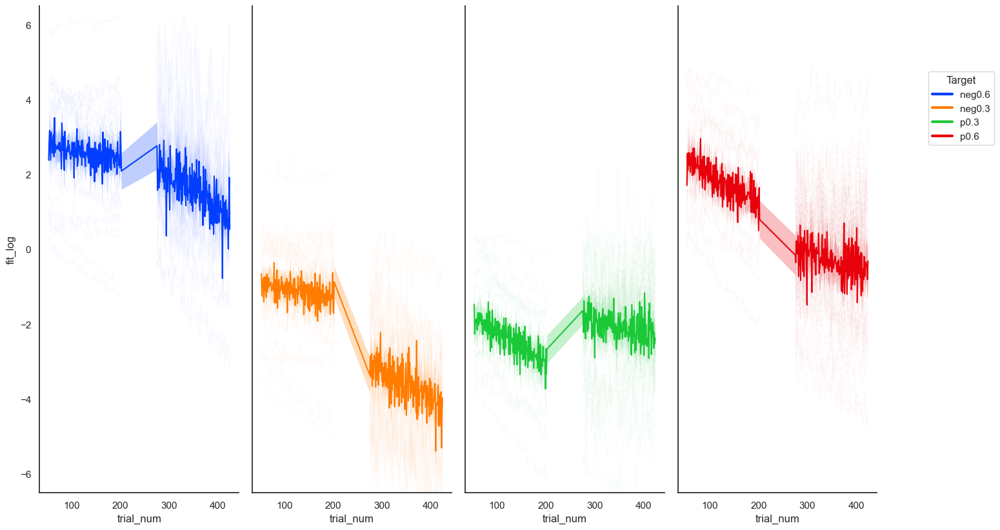

In [234]:
plot_exposure_trials(data=df_pred,
                     y_col='fit_log',
                     y_lim=(-6.5,6.5),
                     x_col='trial_num'
                    )

In [172]:
df_pred.groupby(['target_x_label'])['trial_num'].nunique()


C:\Users\jacob\AppData\Local\Temp\ipykernel_21584\2625643906.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_pred.groupby(['target_x_label'])['trial_num'].nunique()


target_x_label
1    300
2    300
3    300
4    300
Name: trial_num, dtype: int64

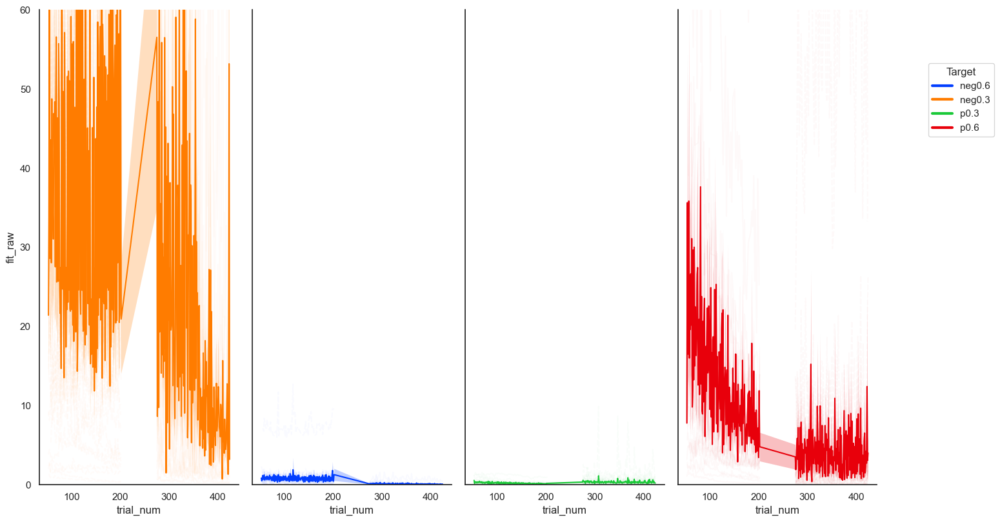

In [196]:
plot_exposure_trials(data=df_pred,
                     y_col='fit_raw',
                     y_lim=(0,60),
                     x_col='trial_num'
                    )

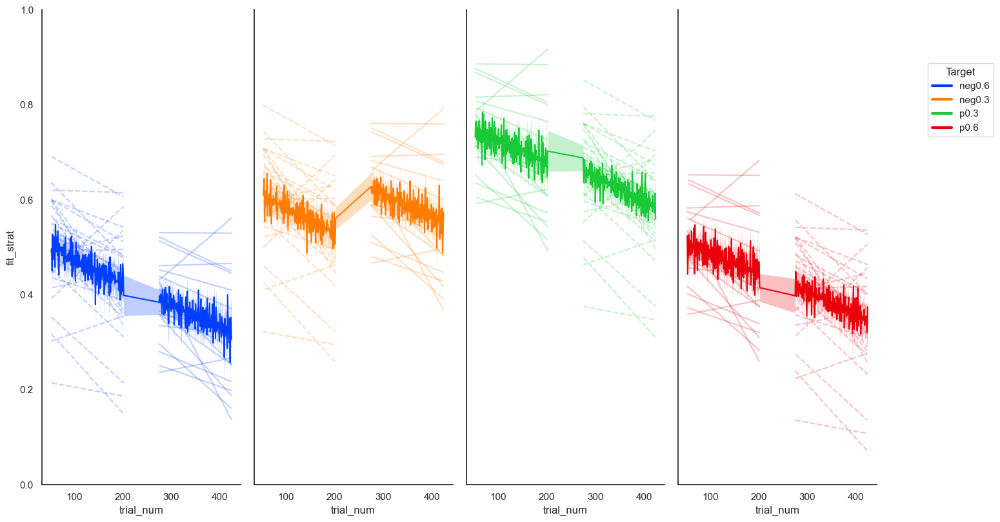

In [240]:
plot_exposure_trials(data=df_pred,
                     y_col='fit_strat',
                     y_lim=(0.0,1.0),
                     x_col='trial_num'
                    )

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

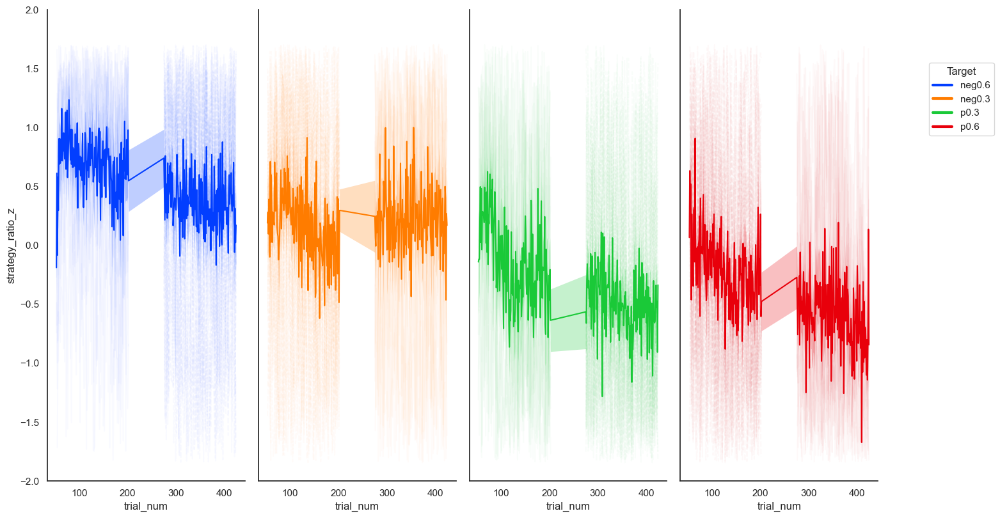

In [247]:
plot_exposure_trials(data=df_no_baseline_wash_BC,
                     y_col='strategy_ratio_z',
                     y_lim=(-2,2),
                     x_col='trial_num'
                    )

In [250]:
%%R

library(lme4)

# Model 1 (reference p0.6)
m_strat2 <- lmer(
  strategy_ratio_z ~ 
    target_x_label * training_phase1 *
    set_order +
    (1 | ppid),
  data = df_no_baseline_wash_BC_R
)

print(summary(m_strat2))



R[write to console]: fixed-effect model matrix is rank deficient so dropping 8 columns / coefficients



Linear mixed model fit by REML ['lmerMod']
Formula: strategy_ratio_z ~ target_x_label * training_phase1 * set_order +  
    (1 | ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: 33204.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.1820 -0.7080  0.0103  0.7312  3.0436 

Random effects:
 Groups   Name        Variance Std.Dev.
 ppid     (Intercept) 0.1377   0.3710  
 Residual             0.7072   0.8409  
Number of obs: 13241, groups:  ppid, 45

Fixed effects:
                                          Estimate Std. Error t value
(Intercept)                               -0.22354    0.08556  -2.613
target_x_labelneg0.3                       0.38319    0.02790  13.733
target_x_labelneg0.6                       0.90544    0.03024  29.938
target_x_labelp0.3                         0.07589    0.02094   3.624
training_phase1FALSE                      -0.35487    0.02094 -16.948
set_order2                                 0.01668    0.11326   0.147
target

In [255]:
%%R

library(lme4)

# Model 1 (reference p0.6)
m_gen2 <- lmer(
  log_min_distance_fixed  ~ 
     training_phase1 *
    set_order + set_order * target_x_label +
    (1 | ppid),
  data = df_no_baseline_wash_BC_R
)

print(summary(m_gen2))



R[write to console]: fixed-effect model matrix is rank deficient so dropping 2 columns / coefficients



Linear mixed model fit by REML ['lmerMod']
Formula: log_min_distance_fixed ~ training_phase1 * set_order + set_order *  
    target_x_label + (1 | ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: 90180.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.5206 -0.2050  0.4022  0.6773  1.4686 

Random effects:
 Groups   Name        Variance Std.Dev.
 ppid     (Intercept)  2.265   1.505   
 Residual             52.660   7.257   
Number of obs: 13241, groups:  ppid, 45

Fixed effects:
                                Estimate Std. Error t value
(Intercept)                       3.1865     0.3820   8.343
training_phase1FALSE             -1.6100     0.1807  -8.911
set_order2                       -0.5679     0.4863  -1.168
target_x_labelneg0.3             -5.1889     0.2657 -19.530
target_x_labelneg0.6             -5.5907     0.2610 -21.423
target_x_labelp0.3               -1.2971     0.1807  -7.179
set_order2:target_x_labelneg0.3   1.4771     0.3586   4.11